In [76]:
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import pearsonr
import matplotlib.gridspec as gridspec
from sklearn.metrics import cohen_kappa_score
from scipy.stats import chi2_contingency
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import os
import math
import xlsxwriter
import numpy as np


In [77]:
!pwd

/Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses


# Import results data

In [78]:
model_list = ["gpt-3.5-turbo-0125", "gpt-4o-mini-2024-07-18", "gpt-4o-2024-05-13", 
                 'reflection:70b', 'gemma2:27b', 'llama3:8b-instruct-fp16', 'llama3:latest', 'gemma:latest', 'mixtral:8x22b',
                 'mistral:v0.2', 'mistral-nemo:latest', 'meditron:70b', 'llama3.1:8b','llama3.1:70b', 'gemma2:9b', 
                 'finalend/athene-70b:latest', 'llama3.2:latest', 'qwen2.5:latest', 'mistral:7b']


model_list = ["gpt-3.5-turbo-0125", "gpt-4o-mini-2024-07-18", "gpt-4o-2024-05-13", 
    'llama3.2:latest',               # 3.21B
    'mistral:v0.2',                  # 7B
    'mistral:7b',                    # 7B
    'qwen2.5:latest',                # 7.26B
    'llama3:8b-instruct-fp16',       # 8.0B
    'llama3:latest',                 # 8.0B
    'llama3.1:8b',                   # 8.0B
    'gemma:latest',                  # 9B
    'gemma2:9b',                     # 9.2B
    'mistral-nemo:latest',           # 12.2B
    'gemma2:27b',                    # 27.2B
    # 'meditron:70b',                  # 69B
    'reflection:70b',                # 70.6B
    'llama3.1:70b',                  # 70.6B
    'finalend/athene-70b:latest',    # 70.6B
    'mixtral:8x22b'                  # 140.6B
]

# llama3.2:3b                0.085870
# gpt-4o-mini-2024-07-18     0.042357
# qwen2.5:7b                 0.018651
# gemma2:9b   


modelsname_infolder = [x.replace("/", "_").replace(":", "_") for x in model_list]  # replace special characters
folder2modelname = dict(zip(modelsname_infolder, model_list))

In [79]:
workdir = "/Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/"
result_type = "results_chroma_chatcosy_fixedparams"

result_type_dir = f"{workdir}results/{result_type}"
os.makedirs(result_type_dir, exist_ok=True)
os.makedirs(f"{result_type_dir}/plots", exist_ok=True)

# os.makedirs(f"{workdir}PICOS/{result_type}/plots", exist_ok=True)
# os.makedirs(f"{workdir}PNP/{result_type}/plots", exist_ok=True)
# os.makedirs(f"{workdir}AI_healthcare/{result_type}/plots", exist_ok=True)


rw_1_workdir = {'directory': f"{workdir}PICOS/",
                'results_directory':f"{workdir}PICOS/{result_type}/",
                "boolean_column_set": ['screening1', 'screening2', 'population_scr1', 'intervention_scr1',
                                       'physio_and_other_scr1', 'e_interventions_scr1', 'control_group_scr1',
                                       'outcome_scr1', 'study_type_scr1', 'predicted_screening1'],
                "columns_needed_as_true": ['population_scr1', 'intervention_scr1', 'physio_and_other_scr1',
                                           'e_interventions_scr1', 'control_group_scr1', 'outcome_scr1',
                                           'study_type_scr1'],
                "model_list": modelsname_infolder,
                "name": "I"}

rw_2_workdir = {'directory': f"{workdir}PNP/",
                'results_directory':f"{workdir}PNP/{result_type}/",
                "boolean_column_set": ['screening1', 'screening2', 'Disease_scr1', 'Treatment_scr1', 'Human_scr1',
                                       'Genetic_scr1',
                                       'Results_scr1', 'predicted_screening1'],
                "columns_needed_as_true": ['Disease_scr1', 'Treatment_scr1', 'Human_scr1', 'Genetic_scr1',
                                           'Results_scr1'],
                "model_list": modelsname_infolder,
                "name": "II"}

rw_3_workdir = {'directory': f"{workdir}AI_healthcare/",
                'results_directory':f"{workdir}AI_healthcare/{result_type}/",
                "boolean_column_set": ['screening1', 'screening2', 'Economic_evaluation_scr1',
                                       'Quantitative_healthcare_outcomes_scr1', 'Relevance_AI_Healthcare_scr1',
                                       'AI_application_description_scr1', 'Economic_outcome_details_scr1',
                                       'predicted_screening1'],

                "columns_needed_as_true": ['AI_functionality_description_scr1', 'Economic_evaluation_scr1', 'Quantitative_healthcare_outcomes_scr1',
                                           'Relevance_AI_Healthcare_scr1', 'AI_application_description_scr1',
                                           'Economic_outcome_details_scr1'],
                "model_list": modelsname_infolder,
                "name": "III"}

In [80]:
criteria_mapping = {
    'population_scr1': 'Population',
    'intervention_scr1': 'Intervention',
    'physio_and_other_scr1': 'Physiotherapy and another treatment',
    'e_interventions_scr1': 'E-interventions',
    'control_group_scr1': 'Control Group',
    'outcome_scr1': 'Outcome',
    'study_type_scr1': 'Study type',
    'Disease_scr1': 'Disease',
    'Treatment_scr1': 'Treatment',
    'Human_scr1': 'Human',
    'Genetic_scr1': 'Genetic',
    'Results_scr1': 'Results',
    'AI_functionality_description_scr1':'AI functionality description', 
    'Economic_evaluation_scr1': 'Economic Evaluation',
    'Quantitative_healthcare_outcomes_scr1': 'Quantitative Healthcare Outcomes',
    'Relevance_AI_Healthcare_scr1': 'Relevance to AI in Healthcare',
    'AI_application_description_scr1': 'AI Application Description',
    'Economic_outcome_details_scr1': 'Economic Outcome Details'
}

model_name_corrections = {
    'gpt-3.5-turbo-0125': 'gpt-3.5-turbo-0125',
    'gpt-4o-mini-2024-07-18': 'gpt-4o-mini-2024-07-18',
    'gpt-4o-2024-05-13': 'gpt-4o-2024-05-13',
    'reflection:70b': 'Reflection:70b',
    'gemma2:27b': 'gemma2:27b',
     'llama3:8b-instruct-fp16': 'llama3:8b-instruct-fp16',
    'llama3:latest': 'llama3:8b',
     'gemma:latest': 'gemma:7b',
    'mixtral:8x22b': 'mixtral:8x22b',
     'mistral:v0.2': 'mistral:v0.2',
    'mistral-nemo:latest': 'mistral-nemo:12b',
    'meditron:70b': 'meditron:70b',
    'llama3.1:8b': 'llama3.1:8b',
    'llama3.1:70b': 'llama3.1:70b',
    'gemma2:9b': 'gemma2:9b',
    'finalend/athene-70b:latest': 'llama3-Athene:70b', 
    'llama3.2:latest' : 'llama3.2:3b', 
    'qwen2.5:latest':'qwen2.5:7b',
    'mistral:7b':'mistral:7b',
    'Human':'Human'
}




## Reformating results data

In [81]:

def process_review(review):
    results_dfs = []
    working_directory = review['directory']
    results_directory = review['results_directory']
    og_df = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
    print(f"Original DataFrame shape: {og_df.shape}")
    og_df.reset_index(drop=True, inplace=True)
    
    # Ensure 'rec-number' exists and is unique
    if 'rec-number' not in og_df.columns:
        og_df['rec-number'] = og_df.index
    else:
        og_df['rec-number'] = range(len(og_df))
    
    excel_path = f"{result_type_dir}/{review['name']}_criteria_results.xlsx"
    has_valid_data = False
    
    all_criteria_dfs = {}  # Store all criteria DataFrames to write at once
    
    # First, collect all the data
    for model in tqdm(review['model_list']):
        print(f"\nProcessing model: {model}")
        
        try:
            # Load both predicted criteria and missing records
            predicted_criteria_path = f"{results_directory}results_{model}/screening1/screening1_predicted_criteria.pkl"
            missing_records_path = f"{results_directory}results_{model}/screening1/screening1_missing_records.pkl"
            
            with open(predicted_criteria_path, 'rb') as file:
                predicted_criteria = pickle.load(file)
            
            missing_records = set()
            if os.path.exists(missing_records_path):
                with open(missing_records_path, 'rb') as file:
                    missing_records = pickle.load(file)
            
            print(f"Number of successfully analyzed records: {len(predicted_criteria)}")
            print(f"Number of records that couldn't be analyzed: {len(missing_records)}")
            
            # Transform the criteria data with improved label handling and include reasons
            transformed_data = {}
            reasons_data = {}  # Store reasons separately
            
            for index, item in predicted_criteria.items():
                if int(index) in missing_records:
                    continue
                    
                transformed_data[int(index)] = {}
                reasons_data[int(index)] = {}
                
                for criterion, entry in item.items():
                    if isinstance(entry, dict):
                        label = entry.get('label', False)
                        reason = entry.get('reason', '')  # Get the reason if available
                    else:
                        label = entry
                        reason = ''
                    
                    if isinstance(label, bool):
                        transformed_data[int(index)][criterion] = label
                    elif isinstance(label, str):
                        label_lower = label.lower().strip()
                        if label_lower == 'true' or label_lower == 't' or label_lower == 'yes':
                            transformed_data[int(index)][criterion] = True
                        elif label_lower == 'false' or label_lower == 'f' or label_lower == 'no':
                            transformed_data[int(index)][criterion] = False
                        else:
                            transformed_data[int(index)][criterion] = False
                    else:
                        transformed_data[int(index)][criterion] = False
                    
                    reasons_data[int(index)][f"{criterion}_reason"] = reason
            
            if not transformed_data:
                print(f"WARNING: No valid records found for model {model}")
                continue
                
            # Create DataFrame from criteria data
            criteria_df = pd.DataFrame.from_dict(transformed_data, orient='index')
            reasons_df = pd.DataFrame.from_dict(reasons_data, orient='index')
            
            if len(criteria_df) == 0:
                print(f"WARNING: Empty criteria DataFrame for model {model}")
                continue
                
            # Ensure all values are boolean
            for col in criteria_df.columns:
                criteria_df[col] = criteria_df[col].astype(bool)
            
            # Append '_scr1' to all column names in criteria_df
            criteria_df.columns = [col + '_scr1' for col in criteria_df.columns]
            
            # Create the new 'predicted_screening1' column
            criteria_df['predicted_screening1'] = criteria_df.apply(lambda row: all(row), axis=1)
            
            # Reset the index and rename it to 'rec-number' to match og_df
            criteria_df = criteria_df.reset_index().rename(columns={'index': 'rec-number'})
            reasons_df = reasons_df.reset_index().rename(columns={'index': 'rec-number'})
            
            # Merge with original dataframe to get title and abstract
                      # Rename 'record' to 'Record' if it exists
            if 'record' in og_df.columns:
                og_df = og_df.rename(columns={'record': 'Record'})
                
            detailed_df = og_df[['rec-number', 'Record']].merge(
                criteria_df,
                on='rec-number',
                how='right'
            )
            
            # Add reasons
            detailed_df = detailed_df.merge(reasons_df, on='rec-number', how='left')
            
            # Reorder columns to group logically: rec-number, title, abstract, then alternating label and reason
            base_cols = ['rec-number', 'Record']
            
            # Get criteria columns without _scr1 suffix for pairing
            criteria_cols = [col.replace('_scr1', '') for col in detailed_df.columns 
                           if col.endswith('_scr1') and col != 'predicted_screening1']
            
            # Create pairs of label and reason columns
            paired_cols = []
            for criterion in criteria_cols:
                paired_cols.extend([f"{criterion}_scr1", f"{criterion}_reason"])
            
            # Add predicted_screening1 at the end
            if 'predicted_screening1' in detailed_df.columns:
                paired_cols.append('predicted_screening1')
            
            # Combine all columns in desired order
            detailed_df = detailed_df[base_cols + paired_cols]
            
            # Store the detailed_df for later writing
            worksheet_name = model[:31]  # Excel worksheet names limited to 31 chars
            all_criteria_dfs[worksheet_name] = detailed_df
            has_valid_data = True
            
            # Continue with the rest of the processing...
            criteria_df['rec-number'] = criteria_df['rec-number'].astype(int)
            og_df['rec-number'] = og_df['rec-number'].astype(int)
            
            merged_df = og_df[og_df['rec-number'].isin(criteria_df['rec-number'])].merge(
                criteria_df, 
                on='rec-number', 
                how='inner'
            )
            
            results_dfs.append(merged_df)
            
            dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
            merged_df.to_pickle(dataset_path)
            
        except Exception as e:
            print(f"Error processing model {model}: {str(e)}")
            continue
    
    # Only create Excel file if we have valid data
    if has_valid_data and all_criteria_dfs:
        try:
            with pd.ExcelWriter(excel_path, engine='xlsxwriter') as writer:
                for model_name, df in all_criteria_dfs.items():
                    # Write the DataFrame to Excel
                    df.to_excel(writer, sheet_name=model_name, index=False)
                    
                    # Get the xlsxwriter workbook and worksheet objects
                    workbook = writer.book
                    worksheet = writer.sheets[model_name]
                    
                    # Define formats
                    true_format = workbook.add_format({'bg_color': '#90EE90'})  # Light green
                    false_format = workbook.add_format({'bg_color': '#FFB6C1'})  # Light red
                    wrap_format = workbook.add_format({'text_wrap': True})
                    
                    # Set column widths
                    worksheet.set_column('A:A', 10)  # rec-number
                    worksheet.set_column('B:B', 40)  # title
                    
                    # Set width for boolean columns
                    bool_cols = [col for col in df.columns if col.endswith('_scr1')]
                    for col in bool_cols:
                        col_idx = df.columns.get_loc(col)
                        worksheet.set_column(col_idx, col_idx, 15)
                    
                    # Set width for reason columns
                    reason_cols = [col for col in df.columns if col.endswith('_reason')]
                    for col in reason_cols:
                        col_idx = df.columns.get_loc(col)
                        worksheet.set_column(col_idx, col_idx, 40, wrap_format)
                    
                    # Apply conditional formatting to boolean columns
                    boolean_columns = [col for col in df.columns if col.endswith('_scr1') or col == 'predicted_screening1']
                    for col in boolean_columns:
                        col_idx = df.columns.get_loc(col)
                        col_letter = xlsxwriter.utility.xl_col_to_name(col_idx)
                        last_row = len(df)
                        
                        worksheet.conditional_format(
                            f'{col_letter}2:{col_letter}{last_row+1}',
                            {'type': 'cell',
                             'criteria': '=',
                             'value': 'TRUE',
                             'format': true_format}
                        )
                        
                        worksheet.conditional_format(
                            f'{col_letter}2:{col_letter}{last_row+1}',
                            {'type': 'cell',
                             'criteria': '=',
                             'value': 'FALSE',
                             'format': false_format}
                        )
                    
                    # Freeze panes to keep headers visible
                    worksheet.freeze_panes(1, 0)
            
            print(f"\nExcel file saved to: {excel_path}")
        except Exception as e:
            print(f"Error creating Excel file: {str(e)}")
    else:
        print(f"\nNo valid data to write to Excel for review {review['name']}")
    
    return results_dfs


def process_label(label):
    if isinstance(label, bool):
        return label
    elif isinstance(label, str):
        label = label.lower()
        if label == 'true':
            return True
        elif label == 'false':
            return False
        else:
            return np.nan  # Return NaN for unexpected string values
    else:
        return np.nan  # Return NaN for any other unexpected value type

# Process each review
for review in [rw_1_workdir, rw_2_workdir, rw_3_workdir]:
    print(f"\nProcessing review: {review['name']}")
    try:
        results = process_review(review)
        # print(f"Processed {len(results)} models for review {review['name']}")
        # print(f"Number of records in final DataFrame: {len(results[0])}")
    except Exception as e:
        print(f"--------\nError processing review {review['name']}: {str(e)}\n---------")
    print("=" * 50)


Processing review: I
Original DataFrame shape: (4501, 48)


  0%|          | 0/18 [00:00<?, ?it/s]


Processing model: gpt-3.5-turbo-0125
Number of successfully analyzed records: 4497
Number of records that couldn't be analyzed: 4


 11%|█         | 2/18 [00:00<00:04,  3.95it/s]


Processing model: gpt-4o-mini-2024-07-18
Number of successfully analyzed records: 4499
Number of records that couldn't be analyzed: 2

Processing model: gpt-4o-2024-05-13


 17%|█▋        | 3/18 [00:00<00:03,  4.64it/s]

Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 0

Processing model: llama3.2_latest
Number of successfully analyzed records: 4499
Number of records that couldn't be analyzed: 2


 28%|██▊       | 5/18 [00:01<00:02,  5.22it/s]


Processing model: mistral_v0.2
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 1

Processing model: mistral_7b


 33%|███▎      | 6/18 [00:01<00:02,  5.70it/s]

Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 0

Processing model: qwen2.5_latest
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 0


 44%|████▍     | 8/18 [00:01<00:01,  6.33it/s]


Processing model: llama3_8b-instruct-fp16
Number of successfully analyzed records: 4500
Number of records that couldn't be analyzed: 1

Processing model: llama3_latest
Number of successfully analyzed records: 4500
Number of records that couldn't be analyzed: 1


 56%|█████▌    | 10/18 [00:01<00:01,  6.86it/s]


Processing model: llama3.1_8b
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 0

Processing model: gemma_latest


 61%|██████    | 11/18 [00:02<00:01,  4.17it/s]

Number of successfully analyzed records: 4496
Number of records that couldn't be analyzed: 6

Processing model: gemma2_9b
Number of successfully analyzed records: 4496
Number of records that couldn't be analyzed: 5


 72%|███████▏  | 13/18 [00:02<00:00,  5.36it/s]


Processing model: mistral-nemo_latest
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 4456

Processing model: gemma2_27b
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 1


 83%|████████▎ | 15/18 [00:02<00:00,  5.82it/s]


Processing model: reflection_70b
Number of successfully analyzed records: 4501
Number of records that couldn't be analyzed: 1

Processing model: llama3.1_70b
Number of successfully analyzed records: 4498
Number of records that couldn't be analyzed: 4


 94%|█████████▍| 17/18 [00:03<00:00,  6.27it/s]


Processing model: finalend_athene-70b_latest
Number of successfully analyzed records: 4496
Number of records that couldn't be analyzed: 5

Processing model: mixtral_8x22b
Number of successfully analyzed records: 4500
Number of records that couldn't be analyzed: 1


100%|██████████| 18/18 [00:03<00:00,  5.55it/s]



Excel file saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/I_criteria_results.xlsx

Processing review: II
Original DataFrame shape: (1650, 18)


 22%|██▏       | 4/18 [00:00<00:00, 33.13it/s]


Processing model: gpt-3.5-turbo-0125
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: gpt-4o-mini-2024-07-18
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: gpt-4o-2024-05-13
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: llama3.2_latest
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: mistral_v0.2
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: mistral_7b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: qwen2.5_latest
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0


 67%|██████▋   | 12/18 [00:00<00:00, 28.19it/s]


Processing model: llama3_8b-instruct-fp16
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: llama3_latest
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: llama3.1_8b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: gemma_latest
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: gemma2_9b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: mistral-nemo_latest


100%|██████████| 18/18 [00:00<00:00, 30.07it/s]


Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: gemma2_27b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: reflection_70b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: llama3.1_70b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: finalend_athene-70b_latest
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Processing model: mixtral_8x22b
Number of successfully analyzed records: 1650
Number of records that couldn't be analyzed: 0

Excel file saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/II_criteria_results.xlsx

Processing review: III
Original DataFrame shape: (66, 16)


  0%|          | 0/18 [00:00<?, ?it/s]


Processing model: gpt-3.5-turbo-0125
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: gpt-4o-mini-2024-07-18
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: gpt-4o-2024-05-13
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: llama3.2_latest
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: mistral_v0.2
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: mistral_7b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: qwen2.5_latest
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: llama3_8b-instruct-fp16
Number of successfully analyzed records: 66
Number of records that could

 50%|█████     | 9/18 [00:00<00:00, 84.13it/s]


Processing model: llama3.1_8b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: gemma_latest
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: gemma2_9b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: mistral-nemo_latest
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: gemma2_27b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: reflection_70b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: llama3.1_70b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Processing model: finalend_athene-70b_latest
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

100%|██████████| 18/18 [00:00<00:00, 72.05it/s]



Processing model: mixtral_8x22b
Number of successfully analyzed records: 66
Number of records that couldn't be analyzed: 0

Excel file saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/III_criteria_results.xlsx


# Predictive power of inferred criteria over the target variable screening 1

## Pearson Correlation Coefficient analysis

To analyze the influence of the predicted boolean values on the predicted_screening1 column for each model in your dataset, you can follow a systematic approach that involves data preparation, statistical analysis, and visualization. Below is a step-by-step guide, including Python code snippets using pandas, scikit-learn, and statsmodels, to help you perform this analysis effectively.

This study analyzed three distinct datasets corresponding to Reviews I, II, and III, each comprising AI-generated screening results for medical articles. Each dataset was stored in separate directories and included boolean indicators of various inclusion criteria pertinent to the respective review. We initiated the analysis by loading and preprocessing the data, ensuring that all required boolean columns for each review were set to true. This filtering step retained only the records that met the necessary criteria for inclusion in the analysis.

For each review, we aggregated results across multiple LLMs as specified in the provided model lists. The preprocessing involved converting boolean columns to integer representations (0 and 1) to facilitate quantitative analysis. Subsequently, we computed Pearson correlation coefficients to evaluate the linear relationships between selected boolean features and the target variable screening1 for each model within each review. This statistical analysis aimed to identify which features were significantly associated with the screening1 outcomes across different LLMs. The correlation coefficients were organized into pivoted matrices, with models as rows and features as columns, enabling a structured comparison of associations. To visualize these relationships, we generated heatmaps for each review, displaying the Pearson correlation coefficients between boolean features and the target variable. 

In [114]:
def extract_llm_explanations(llm_results, llm_review, llm_record2answer, results_directory, llm):
    # Check if 'uniqueid' is in the DataFrame, if not, use 'Record' or index as fallback
    id_column = 'uniqueid' if 'uniqueid' in llm_results.columns else 'Record' if 'Record' in llm_results.columns else None
    
    if id_column is None:
        print("Warning: Neither 'uniqueid' nor 'Record' column found. Using index as identifier.")
        llm_results['index_id'] = llm_results.index
        id_column = 'index_id'
    
    columns_to_keep = [id_column] + llm_review['boolean_column_set']
    explanations_df = llm_results[columns_to_keep].copy()

    for i, record in explanations_df.iterrows():
        for column in llm_review['columns_needed_as_true']:
            new_column_name = column + "_explanation"
            unique_id = record[id_column]
            reason = llm_record2answer.get(unique_id, {}).get(column.replace("_scr1", ""), {}).get('reason',
                                                                                                   'Missing article')
            explanations_df.at[i, new_column_name] = reason

    # Reorder columns
    explanation_columns = [col + "_explanation" for col in llm_review['columns_needed_as_true']]
    column_order = [id_column] + llm_review['boolean_column_set'] + explanation_columns
    explanations_df = explanations_df[column_order]

    # Save to Excel
    excel_path = f"{results_directory}results_{llm}/explanations_{llm}.xlsx"
    explanations_df.to_excel(excel_path, index=False)
    # print(f"Explanations saved to: {excel_path}")

    return explanations_df

def compute_heatmap_data(df, review, features, target):
    """
    Computes Pearson correlation coefficients between features and target,
    with improved handling of constant inputs and edge cases.
    """
    correlation_results = []
    
    # Iterate over each model within the review
    for model in tqdm(df['model'].unique(), desc=f"Processing Review {review}"):
        model_data = df[df['model'] == model]
        
        for feature in features:
            try:
                # Convert columns to numeric, handling any non-numeric values
                feature_data = pd.to_numeric(model_data[feature], errors='coerce')
                target_data = pd.to_numeric(model_data[target], errors='coerce')
                
                # Create valid data mask
                valid_mask = ~(feature_data.isna() | target_data.isna())
                feature_data = feature_data[valid_mask]
                target_data = target_data[valid_mask]
                
                # Check for constant values
                if feature_data.nunique() < 2 or target_data.nunique() < 2:
                    if feature_data.nunique() < 2:
                        print(f"Warning: Feature '{feature}' is constant for model '{model}' in Review '{review}'")
                    if target_data.nunique() < 2:
                        print(f"Warning: Target '{target}' is constant for model '{model}' in Review '{review}'")
                    corr = np.nan
                else:
                    # Compute correlation only if both variables have variation
                    corr, _ = pearsonr(feature_data, target_data)
                    
                    # Additional validation check
                    if not np.isfinite(corr):
                        print(f"Warning: Non-finite correlation for feature '{feature}' and model '{model}'")
                        corr = np.nan
                
            except Exception as e:
                print(f"Error computing correlation for feature '{feature}' and model '{model}': {str(e)}")
                corr = np.nan
            
            correlation_results.append({
                'model': model,
                'feature': feature,
                'pearson_corr': corr
            })
    
    # Convert results to DataFrame and pivot
    correlation_df = pd.DataFrame(correlation_results)
    
    # Print summary statistics before pivoting
    print(f"\nSummary for Review {review}:")
    print(f"Total correlations computed: {len(correlation_results)}")
    print(f"Number of NaN correlations: {correlation_df['pearson_corr'].isna().sum()}")
    
    # Create heatmap data with features in the specified order
    heatmap_data = pd.pivot_table(
        correlation_df,
        values='pearson_corr',
        index='model',
        columns='feature',
        fill_value=np.nan
    )
    
    # Ensure all features are included in the correct order
    for feature in features:
        if feature not in heatmap_data.columns:
            heatmap_data[feature] = np.nan
    heatmap_data = heatmap_data[features]
    
    return heatmap_data
    
def split_long_names(name, max_length=50):
    if len(name) > max_length:
        words = name.split()
        split_name = ''
        current_length = 0
        for word in words:
            if current_length + len(word) + 1 > max_length:
                split_name += '\n' + word
                current_length = len(word)
            else:
                if split_name:
                    split_name += ' ' + word
                else:
                    split_name = word
                current_length += len(word) + 1
        return split_name
    else:
        return name

def create_publication_heatmaps(heatmap_dict, cmap='RdBu_r', save_path=None, dpi=300):
    """
    Creates publication-quality correlation heatmaps with enhanced aesthetics.
    """
    # Set clean style with white background
    plt.style.use('default')
    plt.rcParams.update({
        'figure.facecolor': 'white',
        'axes.facecolor': 'white',
        'savefig.facecolor': 'white',
        'axes.grid': False,
        'grid.color': '#dddddd',
        'axes.edgecolor': 'black',
        'axes.linewidth': 0.5,
        'xtick.color': 'black',
        'ytick.color': 'black',
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'axes.spines.top': True,
        'axes.spines.right': True,
        'axes.spines.left': True,
        'axes.spines.bottom': True
    })
    
    # Calculate dimensions
    num_reviews = len(heatmap_dict)
    max_models = max(df.shape[0] for df in heatmap_dict.values())
    max_features = max(df.shape[1] for df in heatmap_dict.values())
    
    # Calculate figure size based on content
    width_per_review = 5.5
    height_factor = max(0.5 * max_models, 8)
    
    # Create figure
    fig = plt.figure(figsize=(width_per_review * num_reviews, height_factor))
    
    # Create grid with space for colorbar
    gs = gridspec.GridSpec(1, num_reviews + 1, width_ratios=[*[0.05]*num_reviews, 0.001])
    
    # Use the new colormap API
    cmap_obj = plt.colormaps[cmap].copy()
    cmap_obj.set_bad(color='#f0f0f0')  # Light gray for NaN values
    
    # Normalize color scale
    norm = plt.Normalize(vmin=-1, vmax=1)
    
    for idx, (review, heatmap_data) in enumerate(heatmap_dict.items()):
        ax = fig.add_subplot(gs[0, idx])
        
        # Create enhanced heatmap
        sns.heatmap(
            heatmap_data,
            annot=True,
            fmt='.2f',
            cmap=cmap_obj,
            vmin=-1,
            vmax=1,
            center=0,
            linewidths=0.5,
            linecolor='white',
            cbar=False,
            square=True,
            annot_kws={
                "size": 9,
                "weight": "medium",
            },
            mask=heatmap_data.isna(),
            ax=ax
        )
        
        # Enhanced title with review information
        review_titles = {
            'I': 'Review I\n(Physio)',
            'II': 'Review II\n(Neuro)',
            'III': 'Review III\n(DigiHealth)'
        }
        ax.set_title(review_titles.get(review, f'Review {review}'), 
                    fontsize=12, 
                    fontweight='bold', 
                    pad=20)
        
        # Format x-axis labels
        x_labels = [split_long_names(criteria_mapping.get(label.get_text(), label.get_text()), 
                                   max_length=35) 
                   for label in ax.get_xticklabels()]
        
        ax.set_xticklabels(
            x_labels,
            rotation=45,
            ha='right',
            va='top',
            fontsize=10,
        )
        
        # Format y-axis labels
        y_labels = [model_name_corrections.get(label.get_text(), label.get_text()) 
                   for label in ax.get_yticklabels()]
        
        ax.set_yticklabels(
            y_labels,
            rotation=0,
            fontsize=10,
        )
        
        ax.grid(False)
        
        # Add border
        for spine in ax.spines.values():
            spine.set_visible(True)
            spine.set_linewidth(0.5)
            spine.set_color('black')
    
    # Enhanced colorbar
    cbar_ax = fig.add_subplot(gs[0, -1])
    sm = plt.cm.ScalarMappable(cmap=cmap_obj, norm=norm)
    sm.set_array([])
    cbar = plt.colorbar(sm, cax=cbar_ax)
    cbar.set_label('Pearson Correlation Coefficient', 
                  fontsize=10, 
                  fontweight='bold', 
                  labelpad=10)
    cbar.ax.tick_params(labelsize=10)
    
    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(wspace=0.01, bottom=0.15)
    
    # Remove x and y axis labels for all subplots
    for ax in fig.axes[:-1]:  # Exclude the colorbar axis
        ax.set_xlabel('')
        ax.set_ylabel('')
    
    # Save or display
    if save_path:
        plt.savefig(save_path, 
                    dpi=dpi, 
                    bbox_inches='tight', 
                    facecolor='white',
                    edgecolor='none',
                    pad_inches=0.2,
                    transparent=False)
        plt.close()
    else:
        plt.show()
        
# Helper function for feature name formatting
def format_feature_name(name, max_length=35):
    """Formats feature names for better readability"""
    if len(name) <= max_length:
        return name
        
    words = name.split()
    lines = []
    current_line = []
    current_length = 0
    
    for word in words:
        if current_length + len(word) + 1 <= max_length:
            current_line.append(word)
            current_length += len(word) + 1
        else:
            if current_line:
                lines.append(' '.join(current_line))
            current_line = [word]
            current_length = len(word)
            
    if current_line:
        lines.append(' '.join(current_line))
        
    return '\n'.join(lines)



In [115]:
heatmaps_correlation = {}

for review in [rw_1_workdir, rw_2_workdir, rw_3_workdir]:
    results_dfs = []
    working_directory = review['directory']
    results_directory = review['results_directory']
    original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")

    for model in tqdm(review['model_list'],  desc=f"Review {review['name']}"):
        try:
            dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
            results = pd.read_pickle(dataset_path)
            results.rename(columns={'record': 'Record'}, inplace=True)
            results['model'] = folder2modelname[model]
            results['review'] = review['name']
            
            with open(f"{results_directory}results_{model}/screening1/screening1_predicted_criteria.pkl",'rb') as file:
                record2answer = pickle.load(file)
            with open(f"{results_directory}results_{model}/screening1/screening1_missing_records.pkl", 'rb') as file:
                missing_records = pickle.load(file)
            for column in review['boolean_column_set']:
                results[column] = results[column].astype(bool)
    
            # PUT ALL RESULTS TO READABLE FORMAT (Explanations df)
            extract_llm_explanations(llm_results=results, llm_review=review, llm_record2answer=record2answer, results_directory=results_directory, llm=model)
        
        
            for column in review['boolean_column_set']:
                results[column].astype(bool).astype(int)  # Convert to int for correlation
            
            results_dfs.append(results)

        except Exception as e:
            print(f"Error processing review {review['name']} \t model: {model}: {str(e)}")
            
    # Combine and filter results
    df = pd.concat(results_dfs)
    df_filtered = df[df['model'].isin(model_list)].copy()
    print(f"Filtered dataset contains {df_filtered.shape[0]} rows and {df_filtered.shape[1]} columns.")
    
    # Compute correlations
    heatmaps_correlation[review['name']] = compute_heatmap_data(
        df=df_filtered,
        review=review['name'],
        features=review["columns_needed_as_true"],
        target='screening1'
    )


Review I: 100%|██████████| 18/18 [00:40<00:00,  2.25s/it]


Filtered dataset contains 80989 rows and 58 columns.


Processing Review I: 100%|██████████| 18/18 [00:00<00:00, 98.59it/s]

Error computing correlation for feature 'population_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'intervention_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'physio_and_other_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'e_interventions_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'control_group_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'outcome_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'population_scr1' and model 'gpt-4o-mini-2024-07-18': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'interventio


Review II: 100%|██████████| 18/18 [00:14<00:00,  1.27it/s]


Filtered dataset contains 29700 rows and 27 columns.


Processing Review II: 100%|██████████| 18/18 [00:00<00:00, 206.75it/s]


Error computing correlation for feature 'Disease_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Treatment_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Human_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Genetic_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Results_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Disease_scr1' and model 'gpt-4o-mini-2024-07-18': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Treatment_scr1' and model 'gpt-4o-mini-2024-07-18': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Human_scr1' and model 'gpt-4o-mini-2024

Review III: 100%|██████████| 18/18 [00:00<00:00, 30.56it/s]


Filtered dataset contains 1188 rows and 26 columns.


Processing Review III: 100%|██████████| 18/18 [00:00<00:00, 111.85it/s]

Error computing correlation for feature 'AI_functionality_description_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Economic_evaluation_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Quantitative_healthcare_outcomes_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Relevance_AI_Healthcare_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'AI_application_description_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'Economic_outcome_details_scr1' and model 'gpt-3.5-turbo-0125': data type <class 'numpy.bool'> not inexact
Error computing correlation for feature 'AI_functionality_description_scr1' and model 'gpt-4o-mini-2024-07-18'

In [116]:
heatmaps_correlation

{'I': Empty DataFrame
 Columns: [population_scr1, intervention_scr1, physio_and_other_scr1, e_interventions_scr1, control_group_scr1, outcome_scr1, study_type_scr1]
 Index: [],
 'II': Empty DataFrame
 Columns: [Disease_scr1, Treatment_scr1, Human_scr1, Genetic_scr1, Results_scr1]
 Index: [],
 'III': Empty DataFrame
 Columns: [AI_functionality_description_scr1, Economic_evaluation_scr1, Quantitative_healthcare_outcomes_scr1, Relevance_AI_Healthcare_scr1, AI_application_description_scr1, Economic_outcome_details_scr1]
 Index: []}

/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))


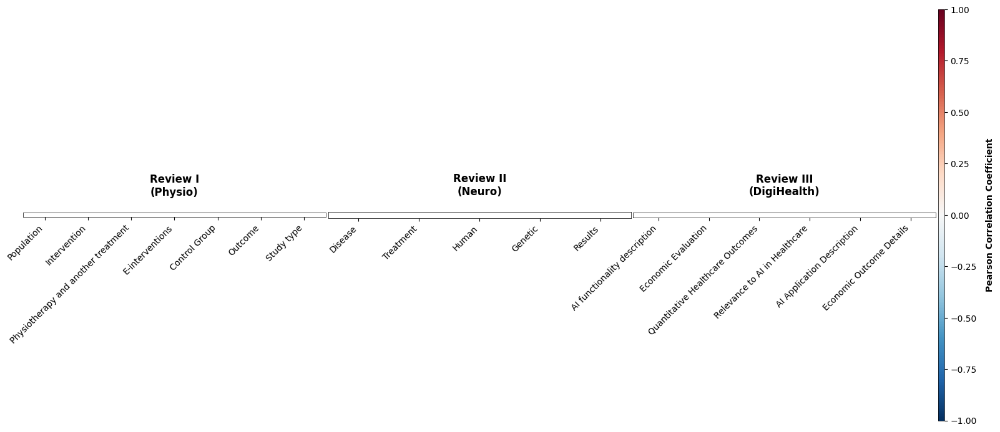

In [111]:
# For quick viewing during development:
create_publication_heatmaps(
    heatmap_dict=heatmaps_correlation,
    cmap='RdBu_r',  # Scientific colormap
    save_path=None  # This will display the plot instead of saving
)

In [85]:

create_publication_heatmaps(
    heatmap_dict=heatmaps_correlation,
    cmap='RdBu_r',  # Scientific colormap
    save_path=f"{result_type_dir}/plots/correlation_analysis.png",  # Save as PDF for publication
    dpi=300  # High resolution
)

/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))
/Users/fernando/opt/anaconda3/envs/test_env/lib/python3.11/site-packages/seaborn/matrix.py:309: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set(xlim=(0, self.data.shape[1]), ylim=(0, self.data.shape[0]))


# Computing performance (all criteria == TRUE)


In [86]:

# Function to calculate PABAK
def calculate_pabak(y_true, y_pred):
    agreement = np.mean(y_true == y_pred)
    pabak = 2 * agreement - 1
    return pabak
    
def calculate_odds_ratio(contingency_table):
    """
    Calculates the Odds Ratio and p-value from a 2x2 contingency table.

    Parameters:
    - contingency_table (np.array): 2x2 confusion matrix [[TN, FP], [FN, TP]].

    Returns:
    - tuple: (Odds Ratio, p-value)
    """
    # Add a small constant to avoid division by zero
    contingency_table = contingency_table + 0.5
    try:
        or_value = (contingency_table[0, 0] / contingency_table[1, 0]) / \
                   (contingency_table[0, 1] / contingency_table[1, 1])
        chi2, p_value, _, _ = chi2_contingency(contingency_table)
    except ZeroDivisionError:
        or_value, p_value = np.nan, np.nan
    return or_value, p_value


def compute_all_metrics(y_true, y_pred):
    """
    Enhanced version of compute_all_metrics with better handling of edge cases for Cohen's Kappa
    """
    from sklearn.metrics import (
        accuracy_score, precision_score, recall_score, f1_score,
        roc_auc_score, cohen_kappa_score, matthews_corrcoef, confusion_matrix
    )
    from scipy.stats import chi2_contingency
    import numpy as np
    
    # Convert to numpy arrays and handle NaNs
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    valid_indices = ~np.isnan(y_true) & ~np.isnan(y_pred)
    y_true = y_true[valid_indices]
    y_pred = y_pred[valid_indices]
    
    # Ensure integer type
    y_true = y_true.astype(int)
    y_pred = y_pred.astype(int)
    
    # Print diagnostics about the data
    print("\nData Diagnostics:")
    print(f"Number of samples: {len(y_true)}")
    print(f"True label distribution: {np.bincount(y_true)}")
    print(f"Predicted label distribution: {np.bincount(y_pred)}")
    
    # Compute confusion matrix components
    cm = confusion_matrix(y_true, y_pred)
    TN, FP, FN, TP = cm.ravel()
    
    # Basic Metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)
    
    # ROC AUC with better error handling
    try:
        roc_auc = roc_auc_score(y_true, y_pred)
    except ValueError:
        print("Warning: ROC AUC could not be computed (possibly single class)")
        roc_auc = np.nan
    
    # Matthews Correlation Coefficient
    mcc = matthews_corrcoef(y_true, y_pred)
    
    # Enhanced Cohen's Kappa computation
    try:
        # Check if there's enough variation for kappa
        if len(np.unique(y_true)) < 2 or len(np.unique(y_pred)) < 2:
            print("Warning: Not enough variation in labels for Cohen's Kappa")
            print(f"Unique values in true labels: {np.unique(y_true)}")
            print(f"Unique values in predicted labels: {np.unique(y_pred)}")
            cohen_kappa = np.nan
        else:
            cohen_kappa = cohen_kappa_score(y_true, y_pred)
    except Exception as e:
        print(f"Error computing Cohen's Kappa: {str(e)}")
        cohen_kappa = np.nan
    
    # PABAK
    pabak = calculate_pabak(y_true, y_pred)
    
    # Odds Ratio with enhanced error handling
    or_value, p_value = calculate_odds_ratio(cm)
    
    # Specificity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else np.nan
    
    # Add counts of predictions
    n_pred_0 = sum(y_pred == 0)
    n_pred_1 = sum(y_pred == 1)
    
    return {
        "TP": TP,
        "TN": TN,
        "FP": FP,
        "FN": FN,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "Specificity": specificity,
        "F1_Score": f1,
        "ROC_AUC": roc_auc,
        "Cohen_Kappa": cohen_kappa,
        "Matthews_Correlation_Coefficient": mcc,
        "PABAK": pabak,
        "Odds_Ratio": or_value,
        "P_Value": p_value,
        "n_pred_0": n_pred_0,
        "n_pred_1": n_pred_1,
        "n_true_labels": len(np.unique(y_true)),
        "n_pred_labels": len(np.unique(y_pred))
    }

def analyze_kappa_results(list_results_alltrue):
    """
    Analyzes Cohen's Kappa results and provides detailed summaries.
    """
    df_results = pd.DataFrame(list_results_alltrue)
    
    # Summary by review
    print("\nAnalysis of Cohen's Kappa by Review:")
    for review in sorted(df_results['review'].unique()):
        review_data = df_results[df_results['review'] == review]
        n_models = len(review_data)
        n_nan = review_data['Cohen_Kappa'].isna().sum()
        
        print(f"\nReview {review}:")
        print(f"Total models: {n_models}")
        print(f"Models with NaN Kappa: {n_nan} ({n_nan/n_models*100:.1f}%)")
        
        # List models with NaN Kappa
        nan_models = review_data[review_data['Cohen_Kappa'].isna()]
        if len(nan_models) > 0:
            print("Models with NaN Kappa:")
            for _, row in nan_models.iterrows():
                print(f"- {row['model']}")
                print(f"  Predicted distribution: {row['n_pred_0']}/{row['n_pred_1']} "
                      f"(Total: {row['n_analyzed']})")
    
    # Overall statistics
    total_models = len(df_results)
    total_nan = df_results['Cohen_Kappa'].isna().sum()
    print(f"\nOverall Statistics:")
    print(f"Total number of models across all reviews: {total_models}")
    print(f"Total number of NaN Kappa values: {total_nan} ({total_nan/total_models*100:.1f}%)")
    
    # Distribution of Kappa values where available
    valid_kappa = df_results['Cohen_Kappa'].dropna()
    if len(valid_kappa) > 0:
        print("\nDistribution of valid Kappa values:")
        print(f"Mean: {valid_kappa.mean():.3f}")
        print(f"Median: {valid_kappa.median():.3f}")
        print(f"Min: {valid_kappa.min():.3f}")
        print(f"Max: {valid_kappa.max():.3f}")
    
    return df_results


In [87]:

# Main execution
list_results_alltrue = []
for review in [rw_1_workdir, rw_2_workdir, rw_3_workdir]:
    print(f"\nProcessing Review {review['name']} ================")
    working_directory = review['directory']
    results_directory = review['results_directory']
    original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
    
    for model in review['model_list']:
        print(f"\nProcessing model: {model}")
        try:
            dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
            results = pd.read_pickle(dataset_path)
            results.rename(columns={'record': 'Record'}, inplace=True)
            
            # Compute metrics with enhanced diagnostics
            dict_results = compute_all_metrics(
                y_true=results['screening1'].to_list(), 
                y_pred=results['predicted_screening1'].to_list()
            )
            
            # Add metadata
            dict_results.update({
                'review': review['name'],
                'model': folder2modelname[model],
                "n_analyzed": len(results),
                "n_missing": len(original_dataset) - len(results),
                "selection_approach": "all_true"
            })
            
            list_results_alltrue.append(dict_results)
            
        except Exception as e:
            print(f"Error processing model {model}: {str(e)}")

# Analyze and get results DataFrame
df_results = analyze_kappa_results(list_results_alltrue)

# Save results to Excel
df_results['model'] = df_results['model'].map(model_name_corrections)
df_results.to_pickle(f"{result_type_dir}/performance_alltrue.pkl")
df_results.to_excel(f"{result_type_dir}/performance_alltrue.xlsx", index=False)
print(f"\nResults saved to: {result_type_dir}/performance_alltrue.xlsx")
performance_alltrue = df_results.copy()


Processing Review I ================

Processing model: gpt-3.5-turbo-0125

Data Diagnostics:
Number of samples: 4497
True label distribution: [4316  181]
Predicted label distribution: [4246  251]

Processing model: gpt-4o-mini-2024-07-18

Data Diagnostics:
Number of samples: 4499
True label distribution: [4318  181]
Predicted label distribution: [4453   46]

Processing model: gpt-4o-2024-05-13

Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [4371  130]

Processing model: llama3.2_latest

Data Diagnostics:
Number of samples: 4499
True label distribution: [4318  181]
Predicted label distribution: [4499]
Unique values in true labels: [0 1]
Unique values in predicted labels: [0]

Processing model: mistral_v0.2

Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [4501]
Unique values in true labels: [0 1]
Unique values in predicted labels: [0]

Processing model: mistral_7

In [88]:
performance_alltrue

,TP,TN,FP,FN,Accuracy,Precision,Recall,Specificity,F1_Score,ROC_AUC,...,P_Value,n_pred_0,n_pred_1,n_true_labels,n_pred_labels,review,model,n_analyzed,n_missing,selection_approach
0,18,4083,233,163,0.911941,0.071713,0.099448,0.946015,0.083333,0.522731,...,1.020699e-02,4246,251,2,2,I,gpt-3.5-turbo-0125,4497,4,all_true
1,7,4279,39,174,0.952656,0.152174,0.038674,0.990968,0.061674,0.514821,...,1.469644e-04,4453,46,2,2,I,gpt-4o-mini-2024-07-18,4499,2,all_true
2,17,4207,113,164,0.938458,0.130769,0.093923,0.973843,0.109325,0.533883,...,1.362292e-07,4371,130,2,2,I,gpt-4o-2024-05-13,4501,0,all_true
3,0,4318,0,181,0.959769,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4499,0,2,1,I,llama3.2:3b,4499,2,all_true
4,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,mistral:v0.2,4501,0,all_true
5,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,mistral:7b,4501,0,all_true
6,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,qwen2.5:7b,4501,0,all_true
7,1,4288,31,180,0.953111,0.031250,0.005525,0.992822,0.009390,0.499174,...,1.000000e+00,4468,32,2,2,I,llama3:8b-instruct-fp16,4500,1,all_true
8,0,4316,3,181,0.959111,0.000000,0.000000,0.999305,0.000000,0.499653,...,1.000000e+00,4497,3,2,2,I,llama3:8b,4500,1,all_true
9,36,3993,327,145,0.895134,0.099174,0.198895,0.924306,0.132353,0.561600,...,3.428239e-09,4138,363,2,2,I,llama3.1:8b,4501,0,all_true


## Confusion matrices

In [89]:

def plot_publication_ready_confusion_matrices(df, cols=4, save_path=None, dpi=300):
    """
    Creates compact publication-ready confusion matrices with minimal spacing.
    """
    # Set style for publication-quality plots
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 9,
        'font.family': 'sans-serif',
        'axes.labelsize': 9,
        'axes.titlesize': 10,
        'xtick.labelsize': 8,
        'ytick.labelsize': 8,
        'figure.titlesize': 12,
        'figure.dpi': dpi,
        'savefig.dpi': dpi,
        'figure.facecolor': 'white',
        'axes.facecolor': 'white',
        'axes.edgecolor': 'black',
        'axes.linewidth': 0.5,
        'grid.alpha': 0.3
    })

    # Review-specific information
    review_info = {
        'I': {'title': 'Review I: Physio', 'n': 4501},
        'II': {'title': 'Review II: Neuro', 'n': 1650},
        'III': {'title': 'Review III: DigiHealth', 'n': 66}
    }

    # Process each review separately
    for review in sorted(df['review'].unique()):
        # Filter and sort data for current review
        review_data = df[df['review'] == review].sort_values('model').copy()
        num_models = len(review_data)
        rows = math.ceil(num_models / cols)
        
        # Create figure with appropriate size (reduced spacing)
        fig = plt.figure(figsize=(cols * 3, rows * 3))
        
        # Add review title with sample size
        review_title = f"{review_info[review]['title']} (n={review_info[review]['n']:,})"
        plt.suptitle(review_title, fontsize=12, y=0.98, fontweight='bold')

        # Create confusion matrices for each model
        for i, (_, row) in enumerate(review_data.iterrows()):
            # Create confusion matrix
            cm = np.array([[row['TN'], row['FP']],
                          [row['FN'], row['TP']]])
            
            # Calculate percentages
            total = cm.sum()
            cm_percentages = cm / total * 100

            ax = plt.subplot(rows, cols, i + 1)
            
            # Create heatmap with counts and percentages
            sns.heatmap(cm, 
                       annot=np.asarray([[f'{int(val)}\n({percentage:.1f}%)' 
                                        for val, percentage in zip(row_vals, row_percentages)]
                                       for row_vals, row_percentages in zip(cm, cm_percentages)]),
                       fmt='', 
                       cmap='Blues',
                       cbar=False,
                       square=True,
                       linewidths=0.5,
                       linecolor='black')
            
            # Enhance subplot appearance
            plt.title(row['model'], fontsize=9, pad=5)
            
            # Add labels only where needed
            if i % cols == 0:
                plt.ylabel('True Label', fontsize=9)
            else:
                ax.set_ylabel('')
            
            if i >= num_models - cols:
                plt.xlabel('Predicted Label', fontsize=9)
            else:
                ax.set_xlabel('')
            
            # Custom axis labels
            plt.xticks([0.5, 1.5], ['False', 'True'], rotation=0)
            plt.yticks([0.5, 1.5], ['False', 'True'], rotation=90)

        # Adjust layout with minimal spacing
        plt.tight_layout(rect=[0, 0, 1, 0.95], h_pad=0.5, w_pad=0.5)
        
        # Save or display the figure
        if save_path:
            review_path = f"{save_path}_review_{review}.png"
            plt.savefig(review_path,
                       bbox_inches='tight',
                       dpi=dpi,
                       facecolor='white',
                       edgecolor='none',
                       pad_inches=0.1)
            print(f"Saved confusion matrices for Review {review} to {review_path}")
            plt.show()
        else:
            plt.show()
        plt.close()


Saved confusion matrices for Review I to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_alltrue_review_I.png


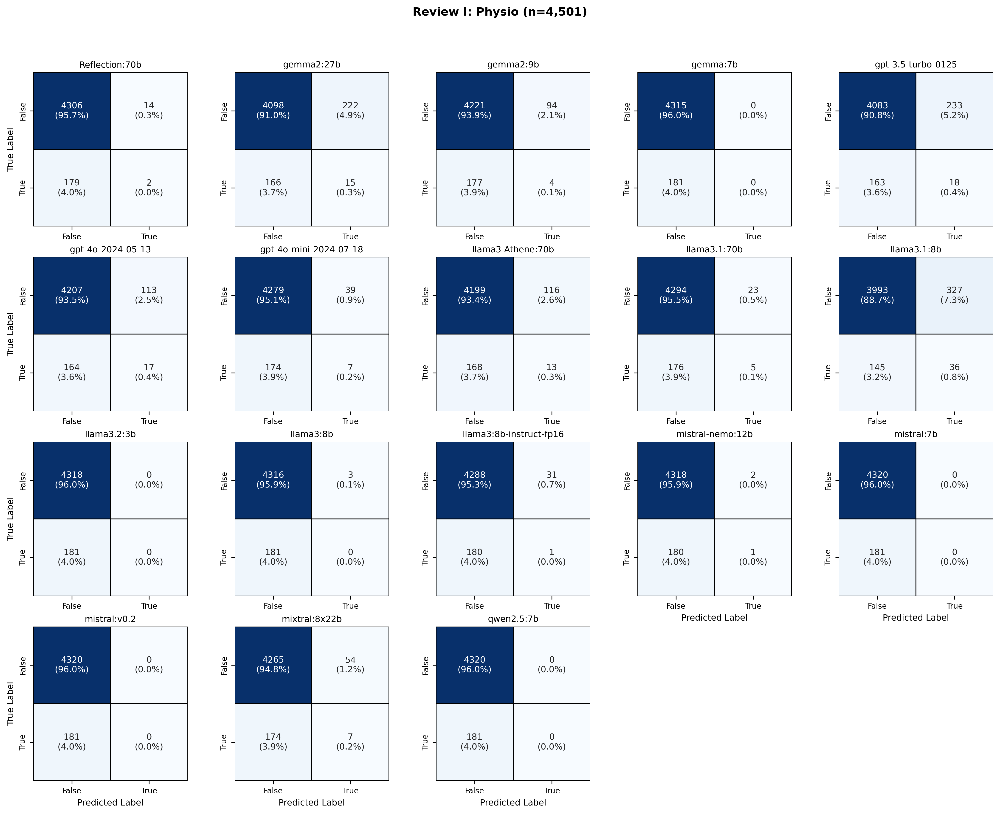

Saved confusion matrices for Review II to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_alltrue_review_II.png


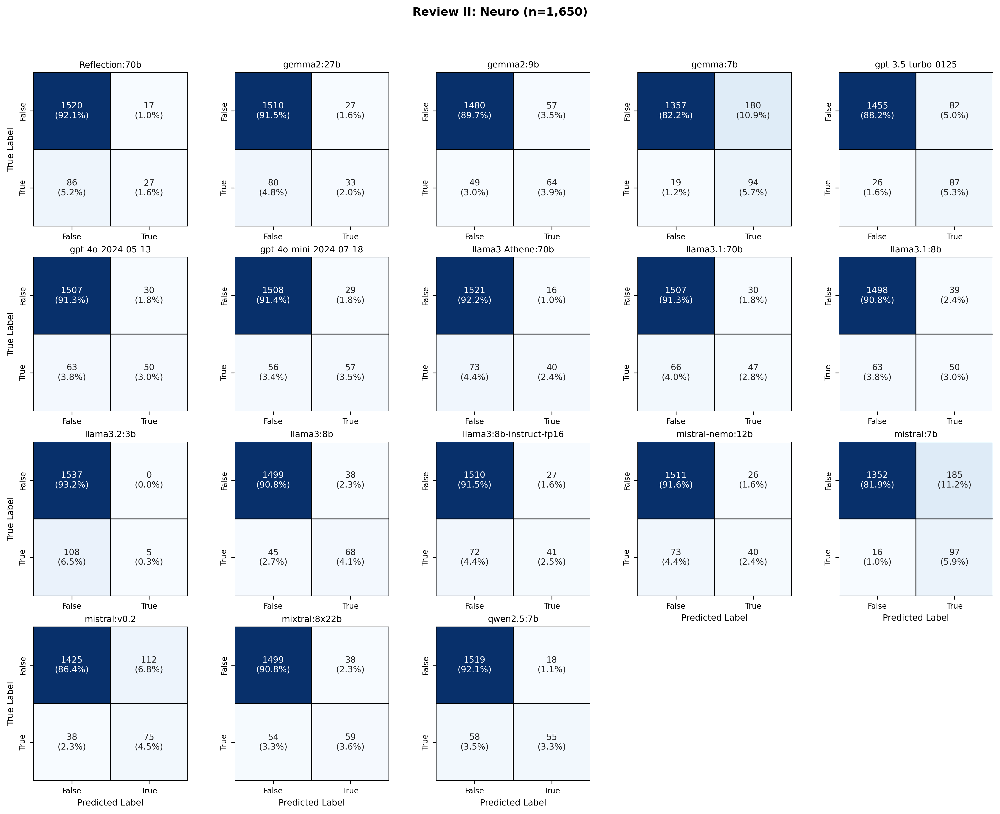

Saved confusion matrices for Review III to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_alltrue_review_III.png


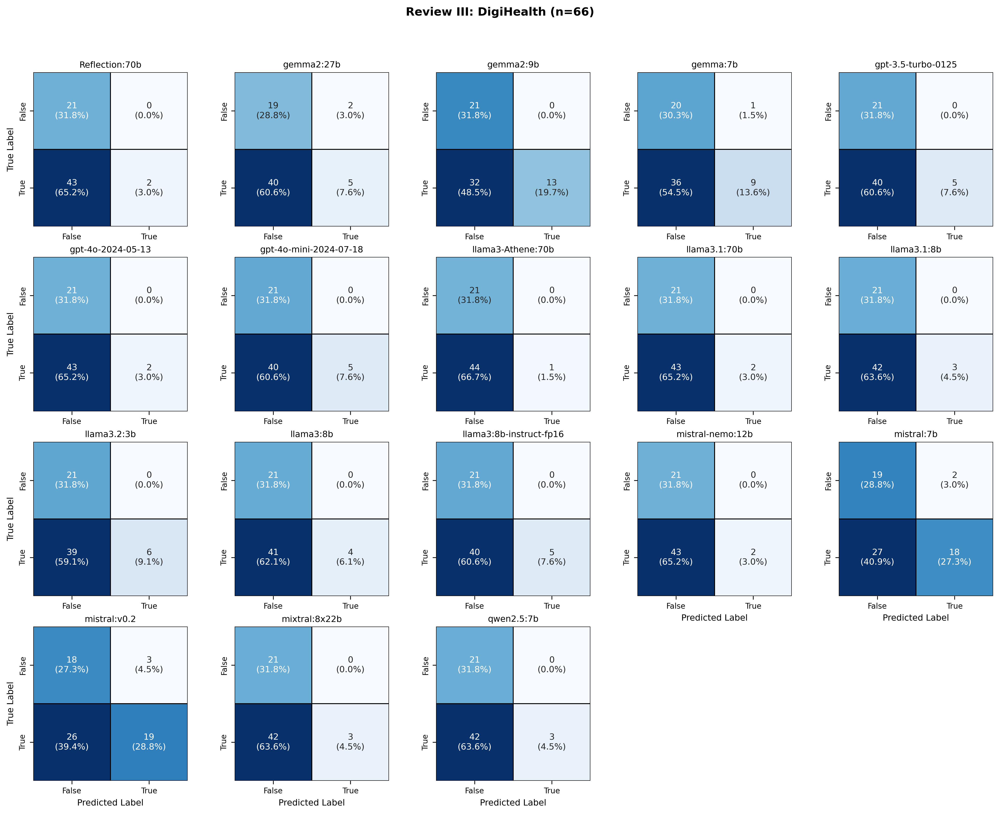

In [90]:

# Use the function
plot_publication_ready_confusion_matrices(
    performance_alltrue,
    cols=5,  # Adjusted for better layout
    save_path=f"{result_type_dir}/plots/cm_alltrue",
    dpi=300
)

In [91]:
performance_alltrue

,TP,TN,FP,FN,Accuracy,Precision,Recall,Specificity,F1_Score,ROC_AUC,...,P_Value,n_pred_0,n_pred_1,n_true_labels,n_pred_labels,review,model,n_analyzed,n_missing,selection_approach
0,18,4083,233,163,0.911941,0.071713,0.099448,0.946015,0.083333,0.522731,...,1.020699e-02,4246,251,2,2,I,gpt-3.5-turbo-0125,4497,4,all_true
1,7,4279,39,174,0.952656,0.152174,0.038674,0.990968,0.061674,0.514821,...,1.469644e-04,4453,46,2,2,I,gpt-4o-mini-2024-07-18,4499,2,all_true
2,17,4207,113,164,0.938458,0.130769,0.093923,0.973843,0.109325,0.533883,...,1.362292e-07,4371,130,2,2,I,gpt-4o-2024-05-13,4501,0,all_true
3,0,4318,0,181,0.959769,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4499,0,2,1,I,llama3.2:3b,4499,2,all_true
4,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,mistral:v0.2,4501,0,all_true
5,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,mistral:7b,4501,0,all_true
6,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,1.000000e+00,4501,0,2,1,I,qwen2.5:7b,4501,0,all_true
7,1,4288,31,180,0.953111,0.031250,0.005525,0.992822,0.009390,0.499174,...,1.000000e+00,4468,32,2,2,I,llama3:8b-instruct-fp16,4500,1,all_true
8,0,4316,3,181,0.959111,0.000000,0.000000,0.999305,0.000000,0.499653,...,1.000000e+00,4497,3,2,2,I,llama3:8b,4500,1,all_true
9,36,3993,327,145,0.895134,0.099174,0.198895,0.924306,0.132353,0.561600,...,3.428239e-09,4138,363,2,2,I,llama3.1:8b,4501,0,all_true



## Quantitative metrics of performance

This study aimed to evaluate the performance of various artificial LLMs in predicting screening outcomes (`screening1`) based on criteria established by human raters. We analyzed three distinct reviews—Review I, Review II, and Review III—each encompassing a unique set of inclusion criteria pertinent to the respective review category. The datasets for these reviews were stored in separate directories (`PICOS/`, `PNP/`, and `AI_healthcare/`) within the working directory `/home/bbb1417/LLM_SR_medicine/new_analyses/`. Each dataset contained preprocessed articles with binary indicators representing the presence or absence of specific screening criteria.

For each review, we assessed the performance of multiple LLMs listed in `modelsname_infolder`. The evaluation process began by loading the preprocessed dataset for the respective review from a pickle file (`preprocessed_articles_filtered.pkl`). We then iterated through each LLM, loading its screening results from corresponding pickle files (`results_screening1.pkl`). To facilitate analysis, we standardized the dataset by renaming the `record` column to `Record` and adding two new columns: `model` and `review`, which denoted the LLM's identifier and the associated review category, respectively. These standardized results were aggregated into a unified dataframe for subsequent analysis.

To quantify the predictive accuracy of each LLM, we computed a comprehensive set of performance metrics by comparing the model-generated predictions (`predicted_screening1`), **which is TRUE when the value of all criteria is TRUE for each analyzed article**, against the ground truth (`screening1`) established by human raters. The metrics included Accuracy, Precision, Recall, Specificity, F1 Score, Receiver Operating Characteristic Area Under the Curve (ROC AUC), Cohen’s Kappa, Matthews Correlation Coefficient (MCC), Prevalence-Adjusted and Bias-Adjusted Kappa (PABAK), Odds Ratio, and the associated p-value. These metrics were calculated using standard definitions and methodologies to ensure consistency and reliability in performance assessment.

The computation of these metrics was facilitated by a series of custom functions. The `calculate_pabak` function derived the PABAK value by adjusting Cohen’s Kappa for prevalence and bias, providing a more nuanced measure of agreement between AI predictions and human ratings. The `calculate_odds_ratio` function determined the Odds Ratio and its statistical significance from the confusion matrix, offering insights into the likelihood of correct predictions relative to incorrect ones. The `compute_all_metrics` function integrated these calculations, generating a comprehensive dictionary of metrics for each model-review combination.

During the analysis, we accounted for the proportion of successfully analyzed articles and the number of articles lacking predictions. Specifically, `n_analyzed` represented the total number of articles evaluated by an LLM within a review, while `n_missing` indicated the number of articles for which predictions were unavailable. This distinction ensured transparency in reporting the scope and limitations of each model's performance.

The aggregated metrics were compiled into a summary dataframe, `performance_alltrue`, which provided a detailed overview of each LLM's performance across all reviews. This structured approach allowed for direct comparisons between models and facilitated the identification of strengths and weaknesses in their predictive capabilities. By employing a robust set of performance indicators, this study comprehensively assessed the efficacy of LLMs in automating the screening process, thereby contributing valuable insights into their potential application in medical research workflows.

In [92]:
def plot_performance_metrics_publication(df_results, metrics, save_path=None, dpi=300):
    """
    Creates publication-ready performance metric plots with proper axis scaling and enhanced styling.
    """
    # Style settings
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 10,
        'font.family': 'sans-serif',
        'axes.labelsize': 11,
        'axes.titlesize': 12,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'legend.fontsize': 10,
        'figure.dpi': dpi
    })

    # Define colors and order
    colors = {'I': '#66c2a5', 'II': '#fc8d62', 'III': '#8da0cb'}
    review_order = ['I', 'II', 'III']

    # Sort models based on mean MCC
    mcc_ranking = df_results.groupby('model')['Matthews_Correlation_Coefficient'].mean().fillna(-1).sort_values(ascending=False)
    model_order = mcc_ranking.index.tolist()

    # Melt the DataFrame
    df_melted = df_results.melt(
        id_vars=['model', 'review'],
        value_vars=metrics,
        var_name='Metric',
        value_name='Value'
    )

    # Format metric names and add categorical column for sorting
    metric_names = {
        'Precision': 'Precision',
        'Recall': 'Recall',
        'Specificity': 'Specificity',
        'F1_Score': 'F1 Score',
        'Matthews_Correlation_Coefficient': 'MCC',
        'PABAK': 'PABAK',
        'ROC_AUC': 'ROC AUC',
        'Cohen_Kappa': 'Cohen\'s Kappa'
    }
    df_melted['Metric'] = df_melted['Metric'].map(metric_names)
    df_melted['model_cat'] = pd.Categorical(df_melted['model'], categories=model_order, ordered=True)
    df_melted = df_melted.sort_values('model_cat')

    # Set up the plot
    num_metrics = len(metrics)
    cols = 2
    rows = (num_metrics + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4.5))
    axes = axes.flatten()

    # Define y-axis limits for different metrics
    y_limits = {
        'Precision': (0, 1),
        'Recall': (0, 1),
        'Specificity': (0, 1),
        'F1 Score': (0, 1),
        'MCC': (-0.5, 1),
        'PABAK': (-0.5, 1),
        'ROC AUC': (0, 1),
        'Cohen\'s Kappa': (0, 1)
    }

    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        formatted_metric = metric_names[metric]
        
        # Create the bar plot
        sns.barplot(
            data=df_melted[df_melted['Metric'] == formatted_metric],
            x='model_cat',
            y='Value',
            hue='review',
            hue_order=review_order,
            palette=colors,
            ax=ax
        )
        
        # Set title and labels
        ax.set_title(formatted_metric, pad=10)
        ax.set_xlabel('')
        ax.set_ylabel(formatted_metric)
        
        # Set y-axis limits
        ax.set_ylim(y_limits.get(formatted_metric, (None, None)))
        
        # Add grid
        ax.grid(True, linestyle='--', alpha=0.7)
        
        # Rotate and align x-axis labels
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
        
        # Remove individual legends
        ax.get_legend().remove()
        
        # Adjust appearance
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Add horizontal line at y=0 for MCC and PABAK
        if formatted_metric in ['MCC', 'PABAK']:
            ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)

    # Remove empty subplots
    for i in range(idx + 1, len(axes)):
        fig.delaxes(axes[i])

    # Add a single legend
    legend_handles, legend_labels = axes[0].get_legend_handles_labels()
    fig.legend(
        legend_handles, 
        ['Review ' + label for label in legend_labels], 
        title='Systematic Review',
        loc='center',
        bbox_to_anchor=(0.5, 0),
        ncol=len(review_order)
    )

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)  # Make room for the legend

    # Save or display the plot
    if save_path:
        plt.savefig(
            save_path,
            bbox_inches='tight',
            dpi=dpi,
            facecolor='white',
            edgecolor='none'
        )
        print(f"Plot saved to: {save_path}")
        plt.show()
        plt.close()
    else:
        plt.show()
        plt.close()


Plot saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/alltrue_metrics_publication.jpeg


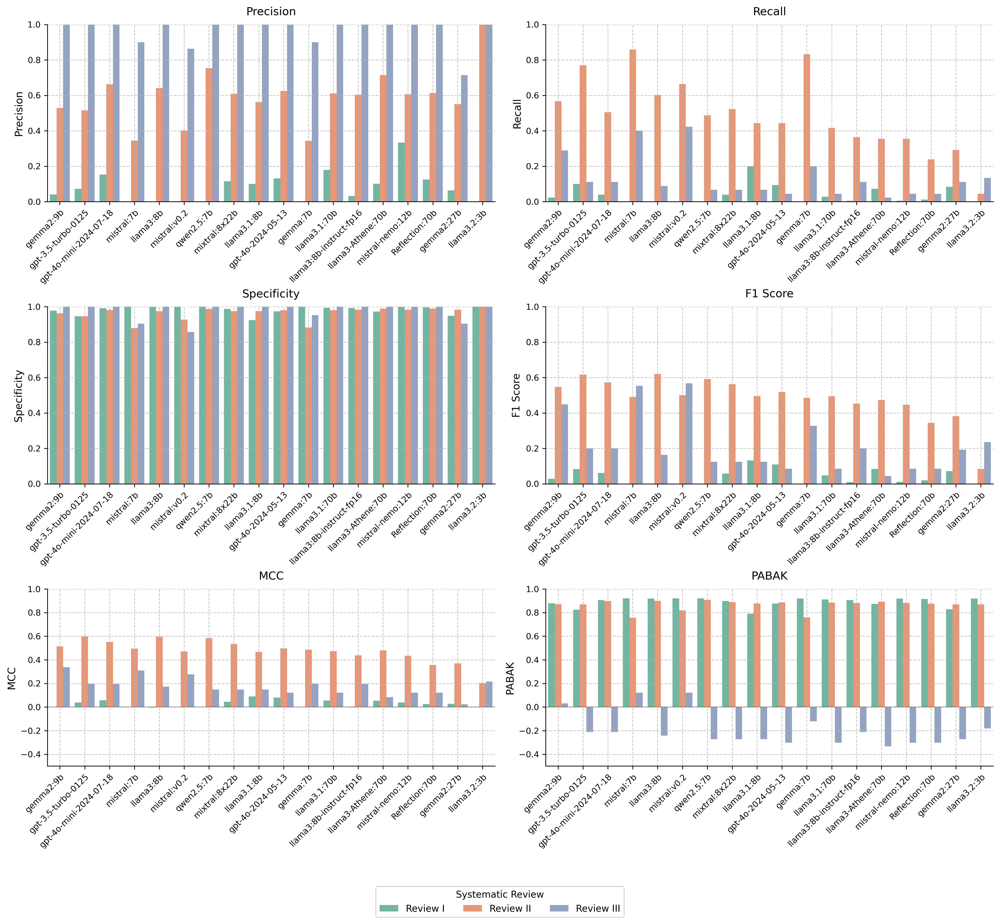

In [93]:
# Example usage:
metrics = [
    'Precision',
    'Recall',
    'Specificity',
    'F1_Score',
    'Matthews_Correlation_Coefficient',
    'PABAK'
]

plot_performance_metrics_publication(
    performance_alltrue,
    metrics,
    save_path=f"{result_type_dir}/plots/alltrue_metrics_publication.jpeg",
    dpi=300
)


| **Metric**                       | **Description**                                                                 | **When to Prioritize**                                                                 |
|-----------------------------------|---------------------------------------------------------------------------------|----------------------------------------------------------------------------------------|
| **Precision**                    | Measures the ability to avoid false positives (relevance of selected articles).  | When minimizing false alarms (incorrect inclusions) is important.                      |
| **Recall**                       | Measures the ability to capture all relevant articles (avoid false negatives).    | When ensuring inclusiveness and avoiding missed relevant articles is crucial.          |
| **Specificity**                  | Measures the ability to correctly reject irrelevant articles (true negatives).    | When excluding irrelevant articles is more critical, especially to avoid unnecessary work. |
| **F1 Score**                     | Balances Precision and Recall (harmonic mean).                                   | When both false positives and false negatives are equally problematic.                 |
| **Matthews Correlation Coefficient (MCC)** | Takes into account true/false positives/negatives. Useful for imbalanced data. | When a nuanced, balanced overall performance measure is needed, especially with class imbalance. |


In [94]:
# Group by model and calculate the mean MCC for each
mcc_ranking = performance_alltrue.groupby('model')['Matthews_Correlation_Coefficient'].mean().sort_values(ascending=False)
# Display the ranking based on MCC
mcc_ranking

model
gemma2:9b                  0.283859
gpt-3.5-turbo-0125         0.277137
gpt-4o-mini-2024-07-18     0.268413
mistral:7b                 0.268029
llama3:8b                  0.254224
mistral:v0.2               0.248932
qwen2.5:7b                 0.244175
mixtral:8x22b              0.242541
llama3.1:8b                0.234774
gpt-4o-2024-05-13          0.232541
gemma:7b                   0.227688
llama3.1:70b               0.217055
llama3:8b-instruct-fp16    0.210140
llama3-Athene:70b          0.205630
mistral-nemo:12b           0.197915
Reflection:70b             0.167931
gemma2:27b                 0.140680
llama3.2:3b                0.139785
Name: Matthews_Correlation_Coefficient, dtype: float64

In [95]:
mean_mcc = performance_alltrue.groupby('model')['Matthews_Correlation_Coefficient'].mean().mean()
mean_mcc

np.float64(0.22563600964329872)

In [96]:
# Group by model and calculate the mean MCC for each
pabak_ranking = performance_alltrue.groupby('model')['PABAK'].mean().sort_values(ascending=False)
# Display the ranking based on MCC
pabak_ranking

model
mistral:v0.2               0.619656
mistral:7b                 0.599050
gemma2:9b                  0.593756
llama3.2:3b                0.535603
gpt-4o-mini-2024-07-18     0.530054
llama3:8b                  0.525064
llama3:8b-instruct-fp16    0.524700
gemma:7b                   0.519020
qwen2.5:7b                 0.518242
mixtral:8x22b              0.504808
mistral-nemo:12b           0.498700
llama3.1:70b               0.497374
Reflection:70b             0.495454
gpt-3.5-turbo-0125         0.493617
gpt-4o-2024-05-13          0.487053
llama3-Athene:70b          0.477484
gemma2:27b                 0.475057
llama3.1:8b                0.464635
Name: PABAK, dtype: float64

## PABAK and cross rater agreements

**PABAK (Prevalence-Adjusted Bias-Adjusted Kappa)** and **Cohen's Kappa** are both measures of inter-rater agreement, but they differ in how they handle imbalanced datasets:

1. **Cohen's Kappa**: 
   - Measures the agreement between two raters (e.g., an LLM and a human reviewer), adjusting for the agreement that could happen by chance.
   - Kappa is sensitive to prevalence (i.e., the proportion of positive or negative cases in the dataset), which can make it less reliable in highly imbalanced datasets.

2. **PABAK**:
   - Adjusts Cohen’s Kappa for imbalanced datasets by correcting for prevalence and bias.
   - This makes PABAK more suitable when there is a significant imbalance between the number of positive and negative cases, such as in systematic reviews where most articles may be irrelevant.

 
**Which to use?**

- **PABAK** is generally preferred when dealing with imbalanced data, as it adjusts for prevalence and provides a clearer picture of agreement in such cases.
- **Cohen's Kappa** is still widely used and can be insightful if the dataset is more balanced or if we want to compare with studies that typically use Kappa.

Since we're dealing with a systematic review dataset, which tends to be imbalanced, **PABAK** would likely be the better metric for our scenario.



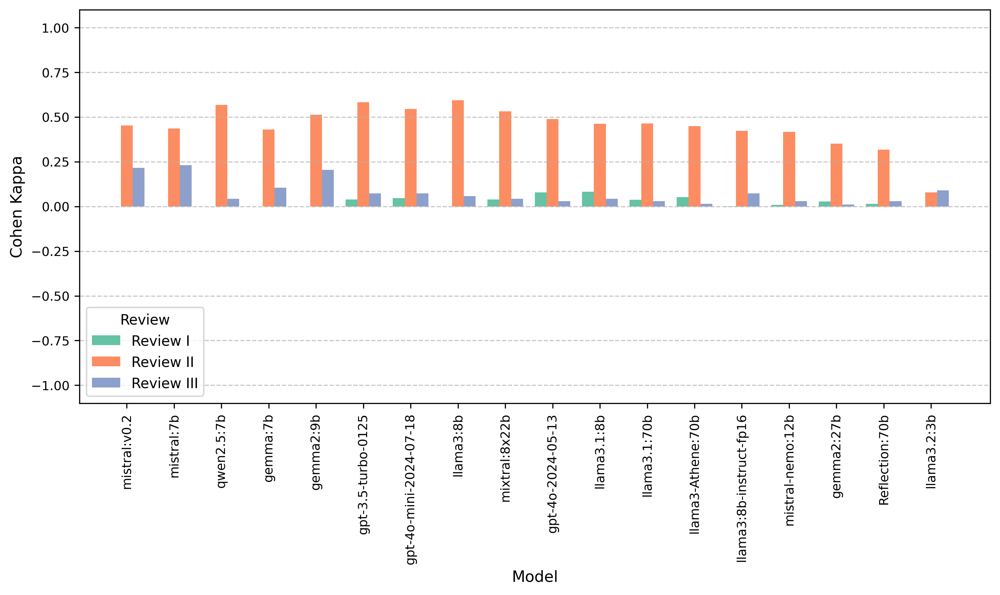

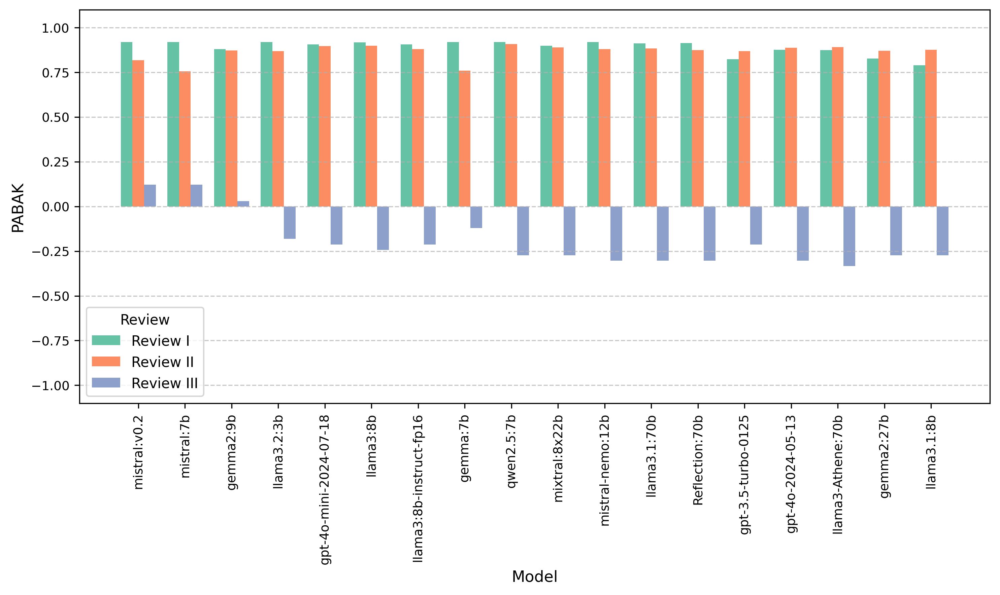

In [97]:
# Define the metrics and colors for the plot
metrics = ['Cohen_Kappa', 'PABAK']
colors = {'I': '#66c2a5', 'II': '#fc8d62', 'III': '#8da0cb'}
review_order = ['I', 'II', 'III']

# Create a filtered dataframe that focuses on the necessary columns
filtered_df = performance_alltrue[['model', 'review', 'Cohen_Kappa', 'PABAK']].copy()

# Ensure the models are ordered by performance for each metric and review
for metric in metrics:
    plt.figure(figsize=(10, 6))
    
    # Sort the models by their mean performance across all reviews for the current metric
    mean_sorted_models = filtered_df.groupby('model')[metric].mean().sort_values(ascending=False).index
    
    # Sort the dataframe by the mean performance for consistent ordering
    sorted_df = filtered_df.set_index('model').loc[mean_sorted_models].reset_index()

    # Grouped bar plots require multiple bars for each model
    bar_width = 0.25
    models = sorted_df['model'].unique()
    indices = np.arange(len(models))  # Positions for the models
    
    # Add grid
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Create grouped bars for each review in the order I, II, III
    for i, review in enumerate(review_order):
        review_df = sorted_df[sorted_df['review'] == review]
        positions = [idx + i * bar_width for idx in indices[:len(review_df)]]
        plt.bar(positions, review_df[metric], width=bar_width, color=colors[review], label=f"Review {review}")
    
    # Labeling the plot
    plt.xlabel('Model')
    plt.ylabel(metric.replace("_", " "))

    # plt.title(f'Comparison of {metric.replace("_", " ")} by Review')
    plt.xticks(indices + bar_width, models, rotation=90)
    
    # Adjust y-axis limits based on the metric
    if metric == 'Matthews_Correlation_Coefficient':
        plt.ylim(-0.5, 0.6)
    else:
        plt.ylim(-1.1, 1.1)
    
    # Add the legend and adjust layout
    plt.legend(title="Review")
    plt.tight_layout()
    
    plt.show()

Looking at the graphs comparing **Cohen's Kappa** and **PABAK**, there are significant differences in the scores for the same models, especially under different review conditions. Here's why this happens:

**Cohen's Kappa:**
- **Kappa** adjusts for chance agreement. In situations with imbalanced datasets, where one class is predominant (e.g., many true negatives and few true positives), Kappa tends to penalize models that have high accuracy driven by the dominant class.
- As you can see in the Kappa graph, some models show relatively low scores, particularly in **Review III**, because Kappa accounts for the fact that some agreements may have occurred by chance. It is a stricter metric in this case.

**PABAK:**
- **PABAK** also adjusts for chance agreement, but it handles class imbalance differently. It is typically more forgiving in situations with extreme imbalance.
- In the PABAK graph, the models show consistently high scores across **Review I** and **Review II**. Even for **Review III**, PABAK scores are higher for most models compared to Kappa, which indicates that PABAK doesn't penalize them as severely for imbalances between classes.
  
**Why the Difference?**
1. **Class Imbalance**: In imbalanced datasets, where the majority class dominates (e.g., many true negatives), Cohen's Kappa can drastically reduce a model’s score by assuming some of the agreements are due to chance. PABAK, however, adjusts differently and tends to give more weight to the observed agreement, which is why it produces higher values.
  
2. **Model Behavior on Minority Classes**: Models that do well on the majority class but struggle with the minority class will likely receive lower Kappa scores, as Kappa will recognize that some of the model’s performance may be due to "chance" alignment with the majority class. In contrast, PABAK might be more forgiving in such cases.

**Conclusion:**
The differences between Cohen's Kappa and PABAK highlight the fact that Cohen's Kappa penalizes models more heavily when there is a high class imbalance, especially if the model performs poorly on the minority class. PABAK, while still adjusting for agreement, gives more weight to overall accuracy and doesn’t penalize class imbalance as much.

Given your data's **heavy class imbalance**, this explains why models might score higher on PABAK but lower on Cohen’s Kappa. PABAK is designed to handle such imbalance, whereas Kappa is stricter in its assessment, particularly on minority classes.

Let me know if you'd like to dive deeper into the specifics of the models or reviews!

### Cross-rater agreements

This study aimed to evaluate the inter-rater agreement between human reviewers and various LLMs, as well as among the LLMs themselves, across three systematic reviews (Reviews I, II, and III). Each review focused on different research topics and had its own dataset of preprocessed articles.

**Data Collection and Preprocessing**

For each review, we collected the human screening decisions and the predictions made by several LLMs. The human screening decisions were sourced from the `screening1` column of the preprocessed dataset, which served as the ground truth. The LLMs provided their predictions in the `predicted_screening1` column. All data were merged based on a unique identifier for each article, referred to as `Record`.

To ensure consistency in the data, we standardized all prediction and label values to integers representing binary classes: 1 for inclusion and 0 for exclusion. This conversion was performed using a custom function that mapped various representations of positive and negative classes (e.g., `True`, `'Yes'`, `1` for positive; `False`, `'No'`, `0` for negative) to their respective integer values. Any unexpected or missing values were treated as `NaN` (not a number) to indicate missing data.

**Handling Missing and Constant Data**

After data preprocessing, we addressed missing values by removing any records where either the human reviewer or the LLM provided no decision. This ensured that only records with valid comparisons were included in the agreement calculations. Additionally, we identified cases where a rater (either the human or an LLM) provided constant predictions (e.g., always predicting inclusion). Since Cohen's Kappa cannot be computed when one or both raters have no variance in their decisions, we set the Cohen's Kappa value to `NaN` for these instances. However, we proceeded to calculate the Prevalence-Adjusted Bias-Adjusted Kappa (PABAK) in such cases, as it remains informative even with constant predictions.

**Computation of Pairwise Agreements**

We computed pairwise inter-rater agreement metrics between all combinations of human reviewers and LLMs for each review separately. The agreement metrics calculated were:

- **Cohen's Kappa**: Measures the agreement between two raters while accounting for the agreement occurring by chance. It ranges from -1 (complete disagreement) to 1 (perfect agreement), with 0 indicating no agreement beyond chance.

- **PABAK**: Adjusts for prevalence and bias in the data, providing a measure of agreement that is less sensitive to class imbalances and constant predictions. It ranges from -1 to 1, similar to Cohen's Kappa.

For each pair of raters, we extracted their decisions and ensured they were in the correct integer format. We then removed any records with missing values for either rater to ensure accurate calculations. If both raters had variability in their decisions, we calculated Cohen's Kappa using scikit-learn's `cohen_kappa_score` function with the labels `[0, 1]`. If one or both raters had constant predictions, we assigned `NaN` to Cohen's Kappa for that pair and calculated PABAK using the formula:

\[
\text{PABAK} = 2 \times \text{Observed Agreement} - 1
\]

where Observed Agreement is the proportion of instances where both raters made the same decision.

**Visualization and Analysis**

The computed agreement metrics were organized into lower triangular matrices for each review, representing the pairwise agreements between all raters (human and LLMs). We visualized these matrices using heatmaps to facilitate comparison and interpretation of the agreement levels. The heatmaps displayed the agreement scores with a color gradient ranging from -1 to 1, allowing us to identify patterns of agreement and disagreement across different models and reviews.

**Statistical Considerations**

By handling cases of constant predictions and adjusting for class imbalances with PABAK, we ensured that the agreement metrics provided a robust assessment of inter-rater reliability. This approach allowed us to account for potential biases in the data and provided a comprehensive evaluation of how closely the LLMs' predictions aligned with human decisions and with each other across different systematic reviews.

All analyses were performed in a consistent computational environment, and custom functions were defined to standardize data preprocessing and metric calculations. This ensured reproducibility of results and facilitated potential future extensions of the study to include additional models or datasets.

In [98]:
def plot_agreement_matrices(review_data, metric_type='both', save_path=None, dpi=300):
    """
    Creates publication-ready agreement matrices with enhanced visualization and error handling.
    
    Parameters:
    - review_data: Dictionary containing review information
    - metric_type: 'kappa', 'pabak', or 'both'
    - save_path: Path to save the plots
    - dpi: Resolution for saved plots
    """
    print(f"\nProcessing Review: {review_data['name']}")
    
    # Style settings
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 10,
        'font.family': 'sans-serif',
        'axes.labelsize': 11,
        'axes.titlesize': 12,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'figure.dpi': dpi
    })

    # Load and preprocess data
    try:
        working_directory = review_data['directory']
        results_directory = review_data['results_directory']
        original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
        original_dataset.rename(columns={'record': 'Record'}, inplace=True)
        
        # Collect human labels
        human_df = original_dataset[['Record', 'screening1']].copy()
        human_df.rename(columns={'screening1': 'Human'}, inplace=True)
        human_df['Human'] = human_df['Human'].apply(convert_to_int)
        
        # Print data shape and sample
        print(f"Original dataset shape: {original_dataset.shape}")
        print(f"Human labels shape: {human_df.shape}")
        print("Sample of human labels:")
        print(human_df['Human'].value_counts())
        
        # Collect model predictions
        results_dfs = []
        for model in review_data['model_list']:
            try:
                dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
                results = pd.read_pickle(dataset_path)
                results.rename(columns={'record': 'Record'}, inplace=True)
                model_name = folder2modelname[model]
                results = results[['Record', 'predicted_screening1']].copy()
                results.rename(columns={'predicted_screening1': model_name}, inplace=True)
                results[model_name] = results[model_name].apply(convert_to_int)
                results_dfs.append(results)
                print(f"Processed model: {model_name}")
            except Exception as e:
                print(f"Error processing model {model}: {str(e)}")
        
        # Merge all data
        merged_df = human_df.copy()
        for df in results_dfs:
            merged_df = pd.merge(merged_df, df, on='Record', how='left')
        
        # Clean up column names
        merged_df.columns = merged_df.columns.map(lambda x: model_name_corrections.get(x, x))
        merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
        
        # Get list of raters
        raters = [col for col in merged_df.columns if col != 'Record']
        print(f"\nRaters in analysis: {raters}")
        
        # Initialize matrices
        n = len(raters)
        cohen_kappa_matrix = pd.DataFrame(index=raters, columns=raters, dtype=float)
        pabak_matrix = pd.DataFrame(index=raters, columns=raters, dtype=float)
        
        # Compute pairwise agreements
        for i in range(n):
            for j in range(n):
                if i >= j:
                    y1 = merged_df[raters[i]].dropna()
                    y2 = merged_df[raters[j]].dropna()
                    
                    # Get common indices
                    common_idx = y1.index.intersection(y2.index)
                    y1 = y1[common_idx].astype(int)
                    y2 = y2[common_idx].astype(int)
                    
                    if len(y1) == 0:
                        print(f"No common samples between {raters[i]} and {raters[j]}")
                        cohen_kappa = pabak = np.nan
                    else:
                        try:
                            if len(np.unique(y1)) < 2 or len(np.unique(y2)) < 2:
                                cohen_kappa = np.nan
                            else:
                                cohen_kappa = cohen_kappa_score(y1, y2)
                            pabak = calculate_pabak(y1, y2)
                        except Exception as e:
                            print(f"Error computing agreement between {raters[i]} and {raters[j]}: {str(e)}")
                            cohen_kappa = pabak = np.nan
                    
                    cohen_kappa_matrix.loc[raters[i], raters[j]] = cohen_kappa
                    pabak_matrix.loc[raters[i], raters[j]] = pabak
                else:
                    cohen_kappa_matrix.loc[raters[i], raters[j]] = np.nan
                    pabak_matrix.loc[raters[i], raters[j]] = np.nan
        
        # Create mask for upper triangle
        mask = np.triu(np.ones_like(cohen_kappa_matrix, dtype=bool))
        
        # Plot matrices
        if metric_type in ['kappa', 'both']:
            fig, ax = plt.subplots(figsize=(12, 10))
            sns.heatmap(cohen_kappa_matrix.astype(float),
                       annot=True,
                       fmt=".2f",
                       cmap='coolwarm',
                       center=0,
                       vmin=-1,
                       vmax=1,
                       mask=mask,
                       linewidths=0.5,
                       linecolor='white',
                       square=True,
                       ax=ax)
            
            plt.title(f"Pairwise Cohen's Kappa - Review {review_data['name']}", pad=20)
            plt.xticks(rotation=45, ha='right')
            plt.yticks(rotation=0)
            
            if save_path:
                plt.savefig(f"{save_path}_kappa_{review_data['name']}.png",
                           bbox_inches='tight',
                           dpi=dpi)
            plt.show()
        
        if metric_type in ['pabak', 'both']:
            fig, ax = plt.subplots(figsize=(12, 10))
            sns.heatmap(pabak_matrix.astype(float),
                       annot=True,
                       fmt=".2f",
                       cmap='coolwarm',
                       center=0,
                       vmin=-1,
                       vmax=1,
                       mask=mask,
                       linewidths=0.5,
                       linecolor='white',
                       square=True,
                       ax=ax)
            
            plt.title(f"Pairwise PABAK - Review {review_data['name']}", pad=20)
            plt.xticks(rotation=45, ha='right')
            plt.yticks(rotation=0)
            
            if save_path:
                plt.savefig(f"{save_path}_pabak_{review_data['name']}.png",
                           bbox_inches='tight',
                           dpi=dpi)
            plt.show()
        
    except Exception as e:
        print(f"Error processing review {review_data['name']}: {str(e)}")
        import traceback
        traceback.print_exc()

# # Process each review
# for review in [rw_1_workdir, rw_2_workdir, rw_3_workdir]:
#     plot_agreement_matrices(
#         review,
#         metric_type='both',
#         save_path=f"{result_type_dir}/plots/agreement_matrices",
#         dpi=300
#     )

In [99]:
# Function to compute agreements with better handling of missing data
def compute_pairwise_agreements(merged_df, raters):
    n = len(raters)
    cohen_kappa_matrix = pd.DataFrame(index=raters, columns=raters, dtype=float)
    pabak_matrix = pd.DataFrame(index=raters, columns=raters, dtype=float)
    sample_sizes = pd.DataFrame(index=raters, columns=raters, dtype=int)
    
    # First, let's print some diagnostics about data availability
    print("\nData availability per rater:")
    for rater in raters:
        valid_count = merged_df[rater].notna().sum()
        # print(f"{rater}: {valid_count} valid ratings")
    
    for i in range(n):
        for j in range(n):
            if i >= j:  # We only need lower triangle
                rater1 = raters[i]
                rater2 = raters[j]
                
                # Get valid data for both raters
                valid_mask = merged_df[rater1].notna() & merged_df[rater2].notna()
                valid_data = merged_df[valid_mask]
                
                # Store sample size
                sample_sizes.loc[rater1, rater2] = len(valid_data)
                
                if len(valid_data) == 0:
                    print(f"\nWarning: No common articles between {rater1} and {rater2}")
                    cohen_kappa = pabak = np.nan
                else:
                    try:
                        y1 = valid_data[rater1].astype(int)
                        y2 = valid_data[rater2].astype(int)
                        
                        # Print distribution for debugging
                        # print(f"\nComparison between {rater1} and {rater2}")
                        # print(f"Number of common articles: {len(y1)}")
                        # print(f"{rater1} distribution: {pd.Series(y1).value_counts().sort_index()}")
                        # print(f"{rater2} distribution: {pd.Series(y2).value_counts().sort_index()}")
                        
                        if len(np.unique(y1)) < 2 or len(np.unique(y2)) < 2:
                            # print(f"Warning: Constant predictions found")
                            cohen_kappa = np.nan
                        else:
                            cohen_kappa = cohen_kappa_score(y1, y2)
                        
                        pabak = calculate_pabak(y1, y2)
                        # print(f"Cohen's Kappa: {cohen_kappa:.3f}, PABAK: {pabak:.3f}")
                        
                    except Exception as e:
                        print(f"Error computing agreement between {rater1} and {rater2}: {str(e)}")
                        cohen_kappa = pabak = np.nan
                
                cohen_kappa_matrix.loc[rater1, rater2] = cohen_kappa
                pabak_matrix.loc[rater1, rater2] = pabak
                
                # For symmetry, fill the upper triangle with NaN
                if i != j:
                    cohen_kappa_matrix.loc[rater2, rater1] = np.nan
                    pabak_matrix.loc[rater2, rater1] = np.nan
                    sample_sizes.loc[rater2, rater1] = np.nan
    
    return cohen_kappa_matrix, pabak_matrix, sample_sizes

# Modified version of data processing part
def process_review_data(review):
    """Process a single review's data with improved handling of missing values"""
    print(f"\nProcessing Review: {review['name']}")
    
    # Load data
    working_directory = review['directory']
    results_directory = review['results_directory']
    original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
    original_dataset.rename(columns={'record': 'Record'}, inplace=True)
    
    # Initialize merged dataframe with human labels
    merged_df = original_dataset[['Record', 'screening1']].copy()
    merged_df.rename(columns={'screening1': 'Human'}, inplace=True)
    merged_df['Human'] = merged_df['Human'].apply(convert_to_int)
    
    # print(f"\nOriginal dataset size: {len(original_dataset)}")
    # print(f"Human labels available: {merged_df['Human'].notna().sum()}")
    
    # Collect model predictions
    for model in review['model_list']:
        try:
            dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
            results = pd.read_pickle(dataset_path)
            
            # Ensure we're using the same Record IDs
            results.rename(columns={'record': 'Record'}, inplace=True)
            model_name = folder2modelname[model]
            
            # Add predictions to merged dataframe
            pred_series = results['predicted_screening1'].apply(convert_to_int)
            merged_df[model_name] = pred_series
            
            # print(f"{model_name}: {pred_series.notna().sum()} predictions")
            
        except Exception as e:
            print(f"Error processing model {model}: {str(e)}")
    
    # Clean up column names and remove duplicates
    merged_df.columns = merged_df.columns.map(lambda x: model_name_corrections.get(x, x))
    merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
    
    # Get list of raters (excluding Record column)
    raters = [col for col in merged_df.columns if col != 'Record']
    
    # Compute agreements
    return compute_pairwise_agreements(merged_df, raters)

# # Demo usage:
# review = rw_1_workdir  # or any other review
# kappa_matrix, pabak_matrix, sample_sizes = process_review_data(review)

# print("\nSample sizes matrix:")
# print(sample_sizes)


Processing Review: I

Data availability per rater:

Processing Review: II

Data availability per rater:

Processing Review: III

Data availability per rater:


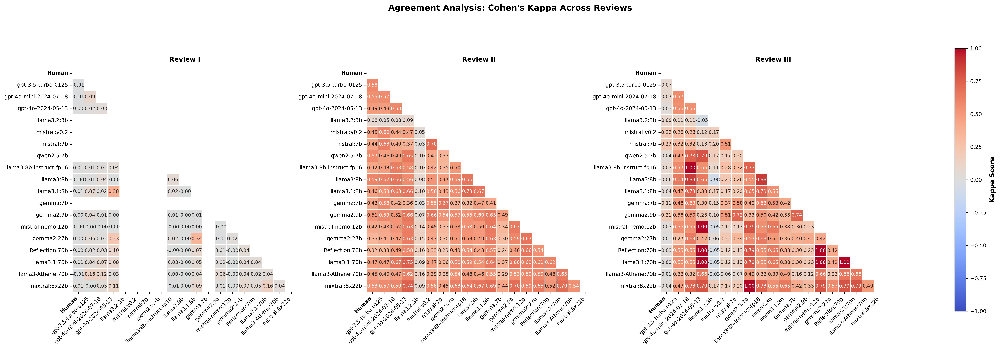

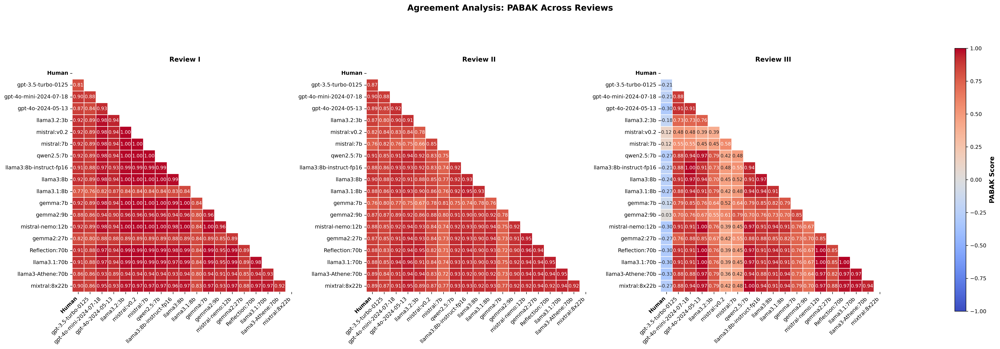

In [100]:
def plot_side_by_side_matrices(reviews, save_path=None, dpi=300):
    """
    Creates publication-ready visualization with three agreement matrices side by side and a shared colorbar.
    Uses improved agreement calculation with cleaner number formatting.
    """
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 8,
        'font.family': 'sans-serif',
        'axes.labelsize': 10,
        'axes.titlesize': 11,
        'xtick.labelsize': 9,
        'ytick.labelsize': 9,
        'legend.fontsize': 9,
        'figure.dpi': dpi
    })

    # Initialize lists to store matrices
    kappa_matrices = []
    pabak_matrices = []
    sample_sizes_matrices = []

    # Process each review with improved agreement calculation
    for review in reviews:
        print(f"\nProcessing Review: {review['name']}")
        
        # Load and process data
        working_directory = review['directory']
        results_directory = review['results_directory']
        original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
        original_dataset.rename(columns={'record': 'Record'}, inplace=True)
        
        # Initialize merged dataframe with human labels
        merged_df = original_dataset[['Record', 'screening1']].copy()
        merged_df.rename(columns={'screening1': 'Human'}, inplace=True)
        merged_df['Human'] = merged_df['Human'].apply(convert_to_int)
        
        # Collect model predictions
        for model in review['model_list']:
            try:
                dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
                results = pd.read_pickle(dataset_path)
                results.rename(columns={'record': 'Record'}, inplace=True)
                model_name = folder2modelname[model]
                
                pred_series = results['predicted_screening1'].apply(convert_to_int)
                merged_df[model_name] = pred_series
                
            except Exception as e:
                print(f"Error processing model {model}: {str(e)}")
        
        # Clean up column names
        merged_df.columns = merged_df.columns.map(lambda x: model_name_corrections.get(x, x))
        merged_df = merged_df.loc[:, ~merged_df.columns.duplicated()]
        
        # Get list of raters
        raters = [col for col in merged_df.columns if col != 'Record']
        
        # Compute agreements using improved method
        kappa_matrix, pabak_matrix, sample_sizes = compute_pairwise_agreements(merged_df, raters)
        
        kappa_matrices.append(kappa_matrix)
        pabak_matrices.append(pabak_matrix)
        sample_sizes_matrices.append(sample_sizes)

    # Function to create subplot with shared colorbar
    def create_agreement_plot(matrices, title, metric_name):
        fig = plt.figure(figsize=(24, 8))
        gs = fig.add_gridspec(1, 4, width_ratios=[1, 1, 1, 0.05])
        axes = [fig.add_subplot(gs[0, i]) for i in range(3)]
        cbar_ax = fig.add_subplot(gs[0, 3])
        
        fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)

        for idx, (matrix, review) in enumerate(zip(matrices, reviews)):
            mask = np.triu(np.ones_like(matrix, dtype=bool))
            
            sns.heatmap(matrix.astype(float),
                       annot=True,
                       fmt='.2f',  # Round to 2 decimal places
                       cmap='coolwarm',
                       center=0,
                       vmin=-1,
                       vmax=1,
                       mask=mask,
                       linewidths=0.5,
                       linecolor='white',
                       square=True,
                       ax=axes[idx],
                       cbar=False)
            
            axes[idx].set_title(f"Review {review['name']}", pad=10, fontweight='bold')
            axes[idx].set_xticklabels(axes[idx].get_xticklabels(), rotation=45, ha='right')
            axes[idx].set_yticklabels(axes[idx].get_yticklabels(), rotation=0)

            # Make 'Human' bold in labels
            x_labels = [make_human_bold(label.get_text()) for label in axes[idx].get_xticklabels()]
            y_labels = [make_human_bold(label.get_text()) for label in axes[idx].get_yticklabels()]
            axes[idx].set_xticklabels(x_labels)
            axes[idx].set_yticklabels(y_labels)

        # Add shared colorbar
        norm = plt.Normalize(vmin=-1, vmax=1)
        sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=norm)
        sm.set_array([])
        cbar = plt.colorbar(sm, cax=cbar_ax)
        cbar.set_label(f'{metric_name} Score', fontsize=11, fontweight='bold', labelpad=5)

        plt.tight_layout(rect=[0, 0, 0.98, 0.95], w_pad=0.2, h_pad=0.5)
        if save_path:
            plt.savefig(f"{save_path}_{metric_name.lower()}.png",
                       bbox_inches='tight',
                       dpi=dpi,
                       facecolor='white',
                       edgecolor='none')
        plt.show()
        plt.close()

    # Create both plots
    create_agreement_plot(kappa_matrices,
                         "Agreement Analysis: Cohen's Kappa Across Reviews", "Kappa")
    create_agreement_plot(pabak_matrices,
                         "Agreement Analysis: PABAK Across Reviews", "PABAK")
def convert_to_int(x):
    """Convert various boolean/string values to integers"""
    if pd.isna(x):
        return np.nan
    elif x in [True, 'True', 1, '1', 'yes', 'Yes', 'TRUE']:
        return 1
    elif x in [False, 'False', 0, '0', 'no', 'No', 'FALSE']:
        return 0
    else:
        return np.nan

def make_human_bold(label):
    """Make the 'Human' label bold in plots"""
    return f'$\\bf{{{label}}}$' if label == 'Human' else label

# Call the function
plot_side_by_side_matrices(
    [rw_1_workdir, rw_2_workdir, rw_3_workdir],
    save_path=f"{result_type_dir}/plots/agreement_matrices_publication",
    dpi=300
)


## Another plotting strategy


# Computing performance (Random Forest)

To evaluate the predictive power of the Boolean criteria predicted by different large language models (LLMs), we implemented a Random Forest (RF) classifier to predict the "screening 1" status of articles. Rather than strictly selecting articles where all criteria are true—which may be overly stringent—we used the individual Boolean values as features in a supervised learning approach.

For each systematic review, we loaded datasets containing the predicted Boolean criteria from various LLMs and the human-determined "screening 1" outcomes. The RF classifier was configured with 100 estimators, a fixed random seed of 42 for reproducibility, and a 'balanced' class weight to address potential class imbalance in the target variable. We converted all feature values and target labels to binary representations (0 or 1) to ensure consistency.

We performed 5-fold cross-validation to evaluate the model's performance, calculating metrics such as precision, recall, specificity, F1-score, Matthews Correlation Coefficient (MCC), Cohen's Kappa, and PABAK. These metrics provided a comprehensive assessment of the classifier's ability to predict the "screening 1" status. We compared the RF classifier's performance to the baseline approach of selecting records that met all criteria (selection_approach="all_true"). Additionally, we visualized the confusion matrices produced by the RF classifier to further analyze its performance (Figure S1).




In [101]:
def process_rf_analysis(review, model, results, original_dataset, feature_cols):
    """
    Process Random Forest analysis for a single model with adaptive cross-validation.
    """
    y = results['screening1']
    X = results[feature_cols].copy()
    
    # Remove rows with NaN values
    mask = X.notnull().all(axis=1) & y.notnull()
    X = X[mask]
    y = y[mask]
    
    if len(X) == 0:
        print(f"Warning: No valid data after preprocessing for {model}")
        return None
        
    # Get class distribution and ensure proper type conversion
    y_int = y.astype(int)
    class_counts = np.bincount(y_int)
    min_class_samples = min(class_counts[class_counts > 0])  # Only count classes that exist
    
    print(f"\nData summary:")
    print(f"Total samples: {len(y)}")
    print(f"Class distribution: {dict(zip(range(len(class_counts)), class_counts))}")
    print(f"Minimum class samples: {min_class_samples}")
    
    # Determine number of folds based on minimum class size
    n_splits = min(5, min_class_samples)
    n_splits = max(2, n_splits)  # Ensure at least 2 folds
    print(f"Using {n_splits}-fold cross-validation")
    
    # Initialize and run Random Forest
    rf_classifier = RandomForestClassifier(
        n_estimators=100,
        random_state=42,
        class_weight='balanced'
    )
    
    # Perform cross-validation predictions with adaptive n_splits
    try:
        y_pred = cross_val_predict(rf_classifier, X, y, cv=n_splits)
        
        # Compute metrics
        dict_results = compute_all_metrics(y_true=y, y_pred=y_pred)
        
        # Update dict_results with additional information
        dict_results.update({
            'review': review['name'],
            'model': folder2modelname[model],
            "n_analyzed": len(X),
            "n_missing": len(original_dataset) - len(X),
            "selection_approach": "RF",
            "n_splits": n_splits  # Add information about number of splits used
        })
        
        return dict_results
        
    except Exception as e:
        print(f"Error processing {model}: {str(e)}")
        return None

# Main analysis loop
list_results_rf = []
for review in [rw_1_workdir, rw_2_workdir, rw_3_workdir]:
    print(f"\nProcessing Review {review['name']} ================")
    working_directory = review['directory']
    results_directory = review['results_directory']
    original_dataset = pd.read_pickle(f"{working_directory}preprocessed_articles_filtered.pkl")
    print(f"{working_directory}preprocessed_articles_filtered.pkl")
    
    for model in tqdm(review['model_list']):
        dataset_path = f"{results_directory}results_{model}/results_screening1.pkl"
        results = pd.read_pickle(dataset_path)
        results.rename(columns={'record': 'Record'}, inplace=True)
        
        feature_cols = review['columns_needed_as_true']
        
        # Process the model
        dict_results = process_rf_analysis(review, model, results, original_dataset, feature_cols)
        if dict_results is not None:
            list_results_rf.append(dict_results)

# Process and save results
df_results = analyze_kappa_results(list_results_rf)
df_results['model'] = df_results['model'].map(model_name_corrections)
df_results.to_pickle(f"{result_type_dir}/performance_RF.pkl")
df_results.to_excel(f"{result_type_dir}/performance_RF.xlsx", index=False)
print(f"\nResults saved to: {result_type_dir}/performance_RF.xlsx")
performance_rf = df_results.copy()


Processing Review I ================
/Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/PICOS/preprocessed_articles_filtered.pkl


  0%|          | 0/18 [00:00<?, ?it/s]


Data summary:
Total samples: 4497
Class distribution: {0: np.int64(4316), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


  6%|▌         | 1/18 [00:00<00:12,  1.33it/s]


Data Diagnostics:
Number of samples: 4497
True label distribution: [4316  181]
Predicted label distribution: [3272 1225]

Data summary:
Total samples: 4499
Class distribution: {0: np.int64(4318), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 11%|█         | 2/18 [00:01<00:11,  1.36it/s]


Data Diagnostics:
Number of samples: 4499
True label distribution: [4318  181]
Predicted label distribution: [3189 1310]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 17%|█▋        | 3/18 [00:03<00:16,  1.13s/it]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [3194 1307]

Data summary:
Total samples: 4499
Class distribution: {0: np.int64(4318), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 22%|██▏       | 4/18 [00:04<00:15,  1.11s/it]


Data Diagnostics:
Number of samples: 4499
True label distribution: [4318  181]
Predicted label distribution: [2551 1948]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 28%|██▊       | 5/18 [00:04<00:12,  1.05it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [3169 1332]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 33%|███▎      | 6/18 [00:05<00:09,  1.20it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [2695 1806]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 39%|███▉      | 7/18 [00:06<00:08,  1.31it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [2988 1513]

Data summary:
Total samples: 4500
Class distribution: {0: np.int64(4319), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 44%|████▍     | 8/18 [00:06<00:07,  1.37it/s]


Data Diagnostics:
Number of samples: 4500
True label distribution: [4319  181]
Predicted label distribution: [2905 1595]

Data summary:
Total samples: 4500
Class distribution: {0: np.int64(4319), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 50%|█████     | 9/18 [00:07<00:06,  1.32it/s]


Data Diagnostics:
Number of samples: 4500
True label distribution: [4319  181]
Predicted label distribution: [2799 1701]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 56%|█████▌    | 10/18 [00:08<00:05,  1.41it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [2897 1604]

Data summary:
Total samples: 4496
Class distribution: {0: np.int64(4315), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 61%|██████    | 11/18 [00:08<00:04,  1.50it/s]


Data Diagnostics:
Number of samples: 4496
True label distribution: [4315  181]
Predicted label distribution: [2209 2287]

Data summary:
Total samples: 4496
Class distribution: {0: np.int64(4315), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 67%|██████▋   | 12/18 [00:09<00:03,  1.53it/s]


Data Diagnostics:
Number of samples: 4496
True label distribution: [4315  181]
Predicted label distribution: [2852 1644]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 72%|███████▏  | 13/18 [00:09<00:03,  1.58it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [3239 1262]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 78%|███████▊  | 14/18 [00:10<00:02,  1.60it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [3013 1488]

Data summary:
Total samples: 4501
Class distribution: {0: np.int64(4320), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 83%|████████▎ | 15/18 [00:11<00:01,  1.63it/s]


Data Diagnostics:
Number of samples: 4501
True label distribution: [4320  181]
Predicted label distribution: [3473 1028]

Data summary:
Total samples: 4498
Class distribution: {0: np.int64(4317), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 89%|████████▉ | 16/18 [00:11<00:01,  1.65it/s]


Data Diagnostics:
Number of samples: 4498
True label distribution: [4317  181]
Predicted label distribution: [3137 1361]

Data summary:
Total samples: 4496
Class distribution: {0: np.int64(4315), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


 94%|█████████▍| 17/18 [00:12<00:00,  1.58it/s]


Data Diagnostics:
Number of samples: 4496
True label distribution: [4315  181]
Predicted label distribution: [3394 1102]

Data summary:
Total samples: 4500
Class distribution: {0: np.int64(4319), 1: np.int64(181)}
Minimum class samples: 181
Using 5-fold cross-validation


100%|██████████| 18/18 [00:12<00:00,  1.38it/s]



Data Diagnostics:
Number of samples: 4500
True label distribution: [4319  181]
Predicted label distribution: [3070 1430]

Processing Review II ================
/Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/PNP/preprocessed_articles_filtered.pkl


  0%|          | 0/18 [00:00<?, ?it/s]


Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


  6%|▌         | 1/18 [00:00<00:07,  2.34it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1435  215]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 11%|█         | 2/18 [00:00<00:06,  2.30it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1474  176]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 17%|█▋        | 3/18 [00:01<00:06,  2.26it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1458  192]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 22%|██▏       | 4/18 [00:01<00:06,  2.31it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1537  113]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 28%|██▊       | 5/18 [00:02<00:05,  2.33it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1392  258]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 33%|███▎      | 6/18 [00:02<00:05,  2.35it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1356  294]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 39%|███▉      | 7/18 [00:03<00:04,  2.34it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1434  216]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 44%|████▍     | 8/18 [00:03<00:04,  2.36it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1457  193]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 50%|█████     | 9/18 [00:03<00:03,  2.36it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1462  188]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 56%|█████▌    | 10/18 [00:04<00:03,  2.37it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1458  192]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 61%|██████    | 11/18 [00:04<00:02,  2.37it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1369  281]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 67%|██████▋   | 12/18 [00:05<00:02,  2.37it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1419  231]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 72%|███████▏  | 13/18 [00:05<00:02,  2.38it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1451  199]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 78%|███████▊  | 14/18 [00:05<00:01,  2.35it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1405  245]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 83%|████████▎ | 15/18 [00:06<00:01,  2.33it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1373  277]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 89%|████████▉ | 16/18 [00:06<00:00,  2.31it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1489  161]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


 94%|█████████▍| 17/18 [00:07<00:00,  2.29it/s]


Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1468  182]

Data summary:
Total samples: 1650
Class distribution: {0: np.int64(1537), 1: np.int64(113)}
Minimum class samples: 113
Using 5-fold cross-validation


100%|██████████| 18/18 [00:07<00:00,  2.33it/s]



Data Diagnostics:
Number of samples: 1650
True label distribution: [1537  113]
Predicted label distribution: [1461  189]

Processing Review III ================
/Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/AI_healthcare/preprocessed_articles_filtered.pkl


  0%|          | 0/18 [00:00<?, ?it/s]


Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


  6%|▌         | 1/18 [00:00<00:06,  2.78it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [21 45]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 11%|█         | 2/18 [00:00<00:05,  2.74it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [12 54]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 17%|█▋        | 3/18 [00:01<00:05,  2.71it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [19 47]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 22%|██▏       | 4/18 [00:01<00:05,  2.74it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [28 38]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 28%|██▊       | 5/18 [00:01<00:04,  2.73it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [22 44]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 33%|███▎      | 6/18 [00:02<00:04,  2.76it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [17 49]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 39%|███▉      | 7/18 [00:02<00:03,  2.79it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [11 55]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 44%|████▍     | 8/18 [00:02<00:03,  2.83it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [33 33]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 50%|█████     | 9/18 [00:03<00:03,  2.85it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [19 47]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 56%|█████▌    | 10/18 [00:03<00:02,  2.87it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [18 48]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 61%|██████    | 11/18 [00:03<00:02,  2.86it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [35 31]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 67%|██████▋   | 12/18 [00:04<00:02,  2.64it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [19 47]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 72%|███████▏  | 13/18 [00:04<00:01,  2.70it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [13 53]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 78%|███████▊  | 14/18 [00:05<00:01,  2.74it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [23 43]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 83%|████████▎ | 15/18 [00:05<00:01,  2.79it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [21 45]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 89%|████████▉ | 16/18 [00:05<00:00,  2.82it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [10 56]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


 94%|█████████▍| 17/18 [00:06<00:00,  2.82it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [11 55]

Data summary:
Total samples: 66
Class distribution: {0: np.int64(21), 1: np.int64(45)}
Minimum class samples: 21
Using 5-fold cross-validation


100%|██████████| 18/18 [00:06<00:00,  2.79it/s]


Data Diagnostics:
Number of samples: 66
True label distribution: [21 45]
Predicted label distribution: [25 41]

Analysis of Cohen's Kappa by Review:

Review I:
Total models: 18
Models with NaN Kappa: 0 (0.0%)

Review II:
Total models: 18
Models with NaN Kappa: 0 (0.0%)

Review III:
Total models: 18
Models with NaN Kappa: 0 (0.0%)

Overall Statistics:
Total number of models across all reviews: 54
Total number of NaN Kappa values: 0 (0.0%)

Distribution of valid Kappa values:
Mean: 0.241
Median: 0.194
Min: -0.147
Max: 0.629

Results saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/performance_RF.xlsx


## Confusion matrices

Saved confusion matrices for Review I to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_RF_review_I.png


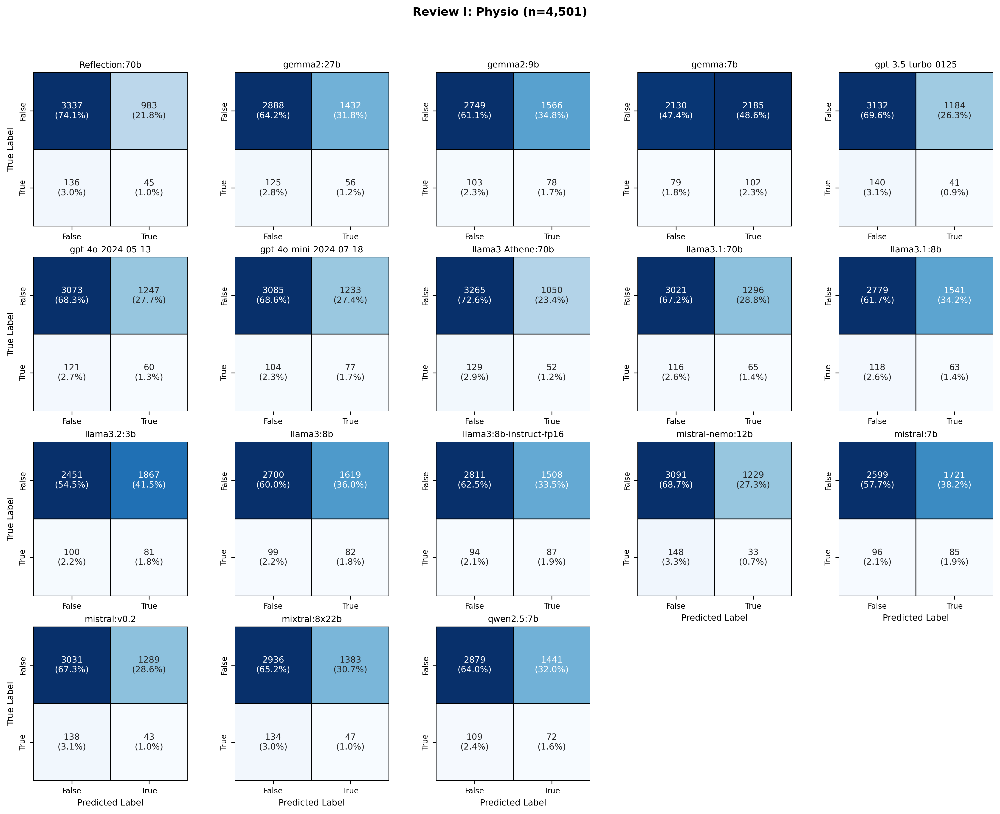

Saved confusion matrices for Review II to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_RF_review_II.png


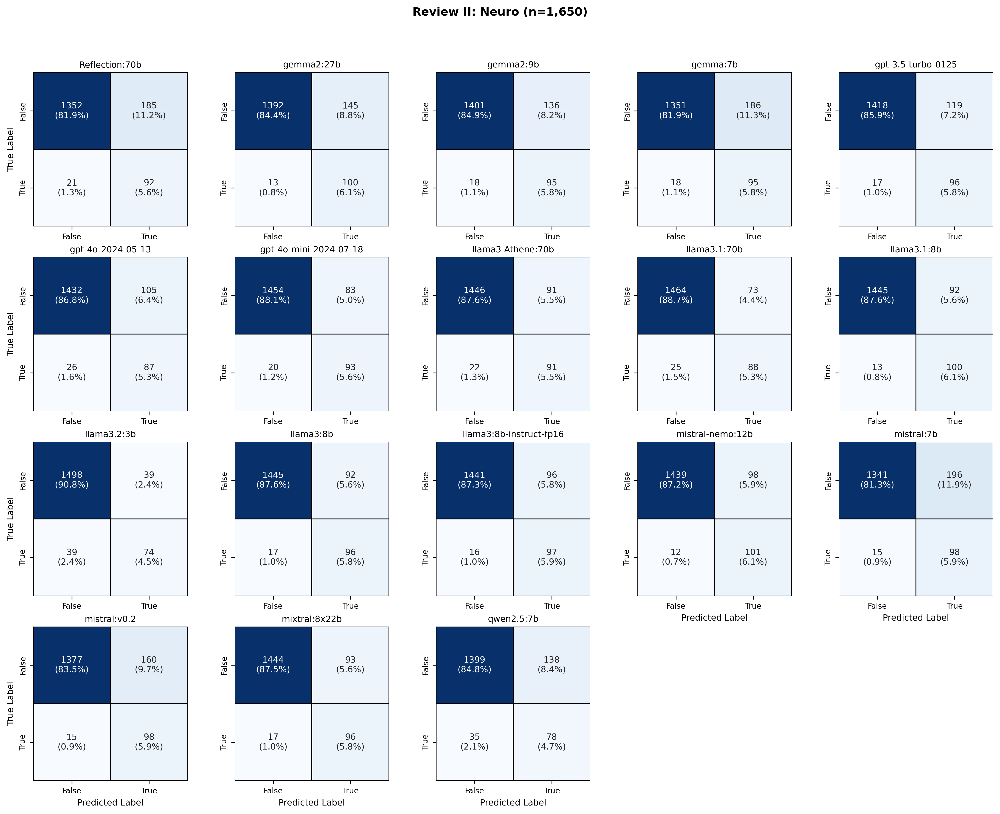

Saved confusion matrices for Review III to /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/cm_RF_review_III.png


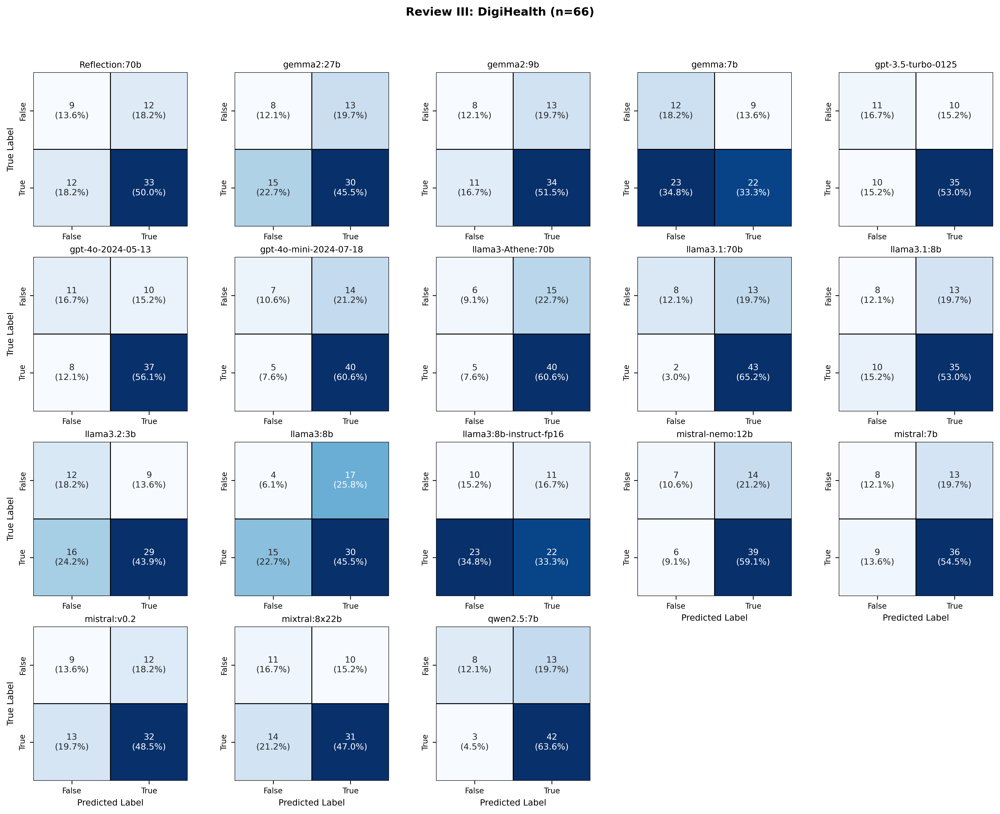

In [102]:
# Use the function
plot_publication_ready_confusion_matrices(
    performance_rf,
    cols=5,  # Adjusted for better layout
    save_path=f"{result_type_dir}/plots/cm_RF",
    dpi=300
)


## Quantitative metrics of performance


Plot saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/RF_metrics_publication.jpeg


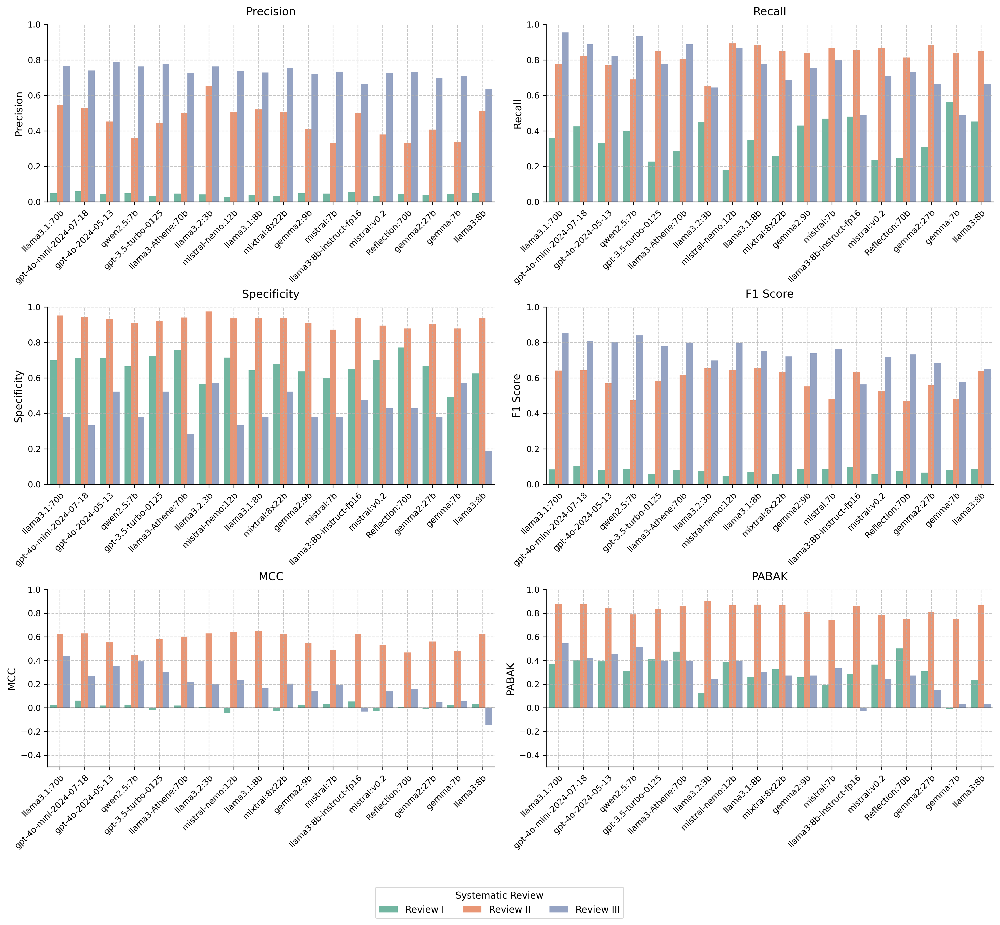

In [103]:
# Example usage:
metrics = [
    'Precision',
    'Recall',
    'Specificity',
    'F1_Score',
    'Matthews_Correlation_Coefficient',
    'PABAK'
]

plot_performance_metrics_publication(
    performance_rf,
    metrics,
    save_path=f"{result_type_dir}/plots/RF_metrics_publication.jpeg",
    dpi=300
)



In [104]:
performance_alltrue = pd.read_pickle(f"{result_type_dir}/performance_alltrue.pkl")
performance_rf = pd.read_pickle(f"{result_type_dir}/performance_RF.pkl")
combined_approach = pd.concat([performance_alltrue, performance_rf])

In [105]:
combined_approach['approrach_review'] = "Review " + combined_approach['review'] + " (" + combined_approach['selection_approach'].replace('all_true', 'All True') + ")"

combined_approach
    

,TP,TN,FP,FN,Accuracy,Precision,Recall,Specificity,F1_Score,ROC_AUC,...,n_pred_1,n_true_labels,n_pred_labels,review,model,n_analyzed,n_missing,selection_approach,n_splits,approrach_review
0,18,4083,233,163,0.911941,0.071713,0.099448,0.946015,0.083333,0.522731,...,251,2,2,I,gpt-3.5-turbo-0125,4497,4,all_true,NaN,Review I (All True)
1,7,4279,39,174,0.952656,0.152174,0.038674,0.990968,0.061674,0.514821,...,46,2,2,I,gpt-4o-mini-2024-07-18,4499,2,all_true,NaN,Review I (All True)
2,17,4207,113,164,0.938458,0.130769,0.093923,0.973843,0.109325,0.533883,...,130,2,2,I,gpt-4o-2024-05-13,4501,0,all_true,NaN,Review I (All True)
3,0,4318,0,181,0.959769,0.000000,0.000000,1.000000,0.000000,0.500000,...,0,2,1,I,llama3.2:3b,4499,2,all_true,NaN,Review I (All True)
4,0,4320,0,181,0.959787,0.000000,0.000000,1.000000,0.000000,0.500000,...,0,2,1,I,mistral:v0.2,4501,0,all_true,NaN,Review I (All True)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49,30,8,13,15,0.575758,0.697674,0.666667,0.380952,0.681818,0.523810,...,43,2,2,III,gemma2:27b,66,0,RF,5.0,Review III (RF)
50,33,9,12,12,0.636364,0.733333,0.733333,0.428571,0.733333,0.580952,...,45,2,2,III,Reflection:70b,66,0,RF,5.0,Review III (RF)
51,43,8,13,2,0.772727,0.767857,0.955556,0.380952,0.851485,0.668254,...,56,2,2,III,llama3.1:70b,66,0,RF,5.0,Review III (RF)
52,40,6,15,5,0.696970,0.727273,0.888889,0.285714,0.800000,0.587302,...,55,2,2,III,llama3-Athene:70b,66,0,RF,5.0,Review III (RF)


In [106]:

def plot_performance_metrics_publication(df_results, metrics, save_path=None, dpi=300):
    """
    Creates publication-ready performance metric plots for comparing model performance
    across different reviews and selection approaches.
    
    Args:
        df_results (pd.DataFrame): Combined performance results
        metrics (list): List of metrics to plot
        save_path (str, optional): Path to save the plot
        dpi (int): Resolution for saved figure
    """
    # Style settings for publication-quality plots
    plt.style.use('default')
    plt.rcParams.update({
        'font.size': 11,
        'font.family': 'sans-serif',
        'axes.labelsize': 12,
        'axes.titlesize': 13,
        'xtick.labelsize': 10,
        'ytick.labelsize': 10,
        'legend.fontsize': 10,
        'figure.dpi': dpi
    })

    # Define professional color palette for reviews and approaches
    colors = {
        'Review I (All True)': '#66c2a5', 'Review I (RF)': '#1b9e77',
        'Review II (All True)': '#fc8d62', 'Review II (RF)': '#e41a1c',
        'Review III (All True)': '#8da0cb', 'Review III (RF)': '#377eb8'
    }
    
    hue_order = [
        'Review I (All True)', 'Review I (RF)',
        'Review II (All True)', 'Review II (RF)',
        'Review III (All True)', 'Review III (RF)'
    ]

    # Sort models based on mean MCC for consistent ordering
    mcc_ranking = df_results.groupby('model')['Matthews_Correlation_Coefficient'].mean().sort_values(ascending=False)
    model_order = mcc_ranking.index.tolist()

    # Prepare data for plotting
    df_melted = df_results.melt(
        id_vars=['model', 'approrach_review'],
        value_vars=metrics,
        var_name='Metric',
        value_name='Value'
    )

    # Format metric names for display
    metric_names = {
        'Precision': 'Precision',
        'Recall': 'Recall',
        'Specificity': 'Specificity',
        'F1_Score': 'F1 Score',
        'Matthews_Correlation_Coefficient': 'MCC',
        'PABAK': 'PABAK',
        'ROC_AUC': 'ROC AUC',
        'Cohen_Kappa': 'Cohen\'s κ'
    }
    
    df_melted['Metric'] = df_melted['Metric'].map(metric_names)
    df_melted['model_cat'] = pd.Categorical(df_melted['model'], categories=model_order, ordered=True)
    df_melted = df_melted.sort_values('model_cat')

    # Set up the plot grid
    num_metrics = len(metrics)
    cols = 2
    rows = (num_metrics + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, rows * 4.5))
    axes = axes.flatten()

    # Define y-axis limits for different metrics
    y_limits = {
        'Precision': (0, 1),
        'Recall': (0, 1),
        'Specificity': (0, 1),
        'F1 Score': (0, 1),
        'MCC': (-0.8, 1),
        'PABAK': (-0.8, 1),
        'ROC AUC': (0, 1),
        'Cohen\'s κ': (-0.8, 1)
    }

    for idx, metric in enumerate(metrics):
        ax = axes[idx]
        formatted_metric = metric_names[metric]
        
        # Create bar plot with error bars
        sns.barplot(
            data=df_melted[df_melted['Metric'] == formatted_metric],
            x='model_cat',
            y='Value',
            hue='approrach_review',
            hue_order=hue_order,
            palette=colors,
            ax=ax,
            capsize=0.05,
            err_kws={'linewidth': 1}
        )
        
        # Customize subplot appearance
        ax.set_title(formatted_metric, pad=10)
        ax.set_xlabel('')
        ax.set_ylabel(formatted_metric)
        
        # Set y-axis limits
        ax.set_ylim(y_limits.get(formatted_metric, (None, None)))
        
        # Add subtle grid
        ax.grid(True, linestyle='--', alpha=0.3)
        
        # Rotate x-axis labels
        plt.setp(ax.get_xticklabels(), rotation=45, ha='right', rotation_mode='anchor')
        
        # Remove individual legends
        ax.get_legend().remove()
        
        # Clean up spines
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        
        # Add reference line at y=0 for certain metrics
        if formatted_metric in ['MCC', 'PABAK', 'Cohen\'s κ']:
            ax.axhline(y=0, color='black', linestyle='-', linewidth=0.5, alpha=0.5)

    # Remove empty subplots
    for i in range(idx + 1, len(axes)):
        fig.delaxes(axes[i])

    # Add a single unified legend
    legend_handles, legend_labels = axes[0].get_legend_handles_labels()
    fig.legend(
        legend_handles, 
        legend_labels,
        title='Review and Selection Approach',
        loc='center',
        bbox_to_anchor=(0.5, 0),
        ncol=3,
        frameon=True,
        edgecolor='black'
    )

    # Adjust layout
    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15)

    # Save or display the plot
    if save_path:
        plt.savefig(
            save_path,
            bbox_inches='tight',
            dpi=dpi,
            facecolor='white',
            edgecolor='none'
        )
        print(f"Plot saved to: {save_path}")
        plt.show()
        plt.close()
    else:
        plt.show()
        plt.close()




Plot saved to: /Users/fernando/Documents/Research/LLM_SR_medicine/new_analyses/results/results_chroma_chatcosy_fixedparams/plots/combined_metrics_publication.jpg


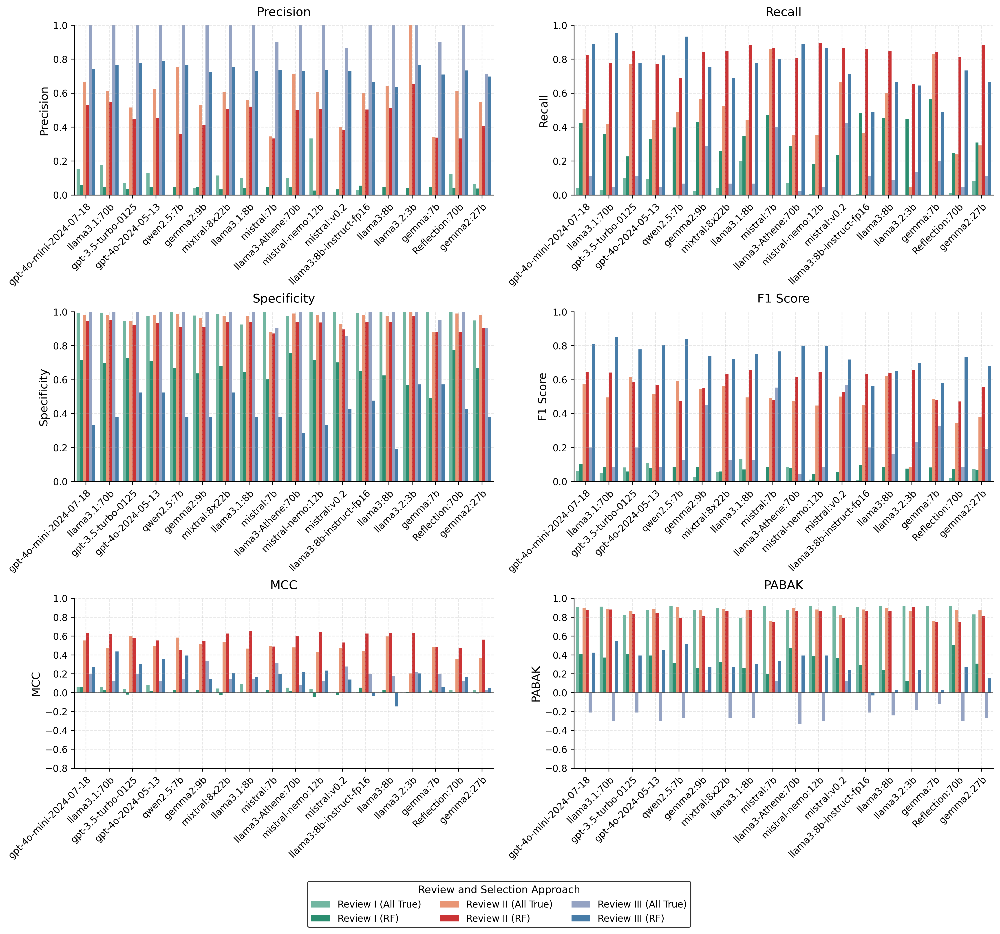

In [107]:
# Define metrics to plot
metrics = ['Precision', 'Recall', 'Specificity', 'F1_Score', 
          'Matthews_Correlation_Coefficient', 'PABAK']

# Create the plot
plot_performance_metrics_publication(
    combined_approach,
    metrics,
    save_path=f"{result_type_dir}/plots/combined_metrics_publication.jpg",
    dpi=300
)

In [108]:
# Group by model and calculate the mean MCC for each
mcc_ranking = performance_rf.groupby('model')['Matthews_Correlation_Coefficient'].mean().sort_values(ascending=False)
# Display the ranking based on MCC
mcc_ranking

model
llama3.1:70b               0.361589
gpt-4o-mini-2024-07-18     0.319358
gpt-4o-2024-05-13          0.309044
qwen2.5:7b                 0.289717
gpt-3.5-turbo-0125         0.286603
llama3-Athene:70b          0.279954
llama3.2:3b                0.279647
mistral-nemo:12b           0.277764
llama3.1:8b                0.270789
mixtral:8x22b              0.268155
gemma2:9b                  0.238580
mistral:7b                 0.236514
llama3:8b-instruct-fp16    0.215674
mistral:v0.2               0.214185
Reflection:70b             0.213538
gemma2:27b                 0.199638
gemma:7b                   0.187449
llama3:8b                  0.170824
Name: Matthews_Correlation_Coefficient, dtype: float64

In [109]:
mean_mcc_rf = performance_rf.groupby('model')['Matthews_Correlation_Coefficient'].mean().mean()
mean_mcc_rf

np.float64(0.25661232223787944)

In [110]:
# Group by model and calculate the mean MCC for each
pabak_ranking = performance_rf.groupby('model')['PABAK'].mean().sort_values(ascending=False)
# Display the ranking based on MCC
pabak_ranking

model
llama3.1:70b               0.599611
llama3-Athene:70b          0.577501
gpt-4o-mini-2024-07-18     0.568347
gpt-4o-2024-05-13          0.562631
mistral-nemo:12b           0.549581
gpt-3.5-turbo-0125         0.546751
qwen2.5:7b                 0.538906
Reflection:70b             0.508602
mixtral:8x22b              0.488391
llama3.1:8b                0.479529
mistral:v0.2               0.465407
gemma2:9b                  0.447874
llama3.2:3b                0.424487
mistral:7b                 0.423400
gemma2:27b                 0.422718
llama3:8b                  0.378209
llama3:8b-instruct-fp16    0.373980
gemma:7b                   0.258638
Name: PABAK, dtype: float64